<a href="https://colab.research.google.com/github/Samy-Annasri/Internship-Adversarial-time-series/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Note:
For the moment, everything is not perfect. For example, I think the BIM attack might be implemented incorrectly based on the results. Moreover, a lot of the code could be refactored to be more efficient and avoid repetition. I also tried to write comments in English, but I believe there are many grammatical mistakes in the notebook, which I will correct when I have time.
This is just what I have done over the past two weeks :)

# Objective of this Notebook

This notebook explores the implementation of different AI models **LSTM**, **RNN** and **CNN** for **time series forecasting adversial attack**.

To achieve this, I use two datasets:

- **GlobalLandTemperaturesByCity**: This dataset is used to forecast temperatures in France based on historical climate data.

    https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data?resource=download&select=GlobalLandTemperaturesByCity.csv)
- **Google Stock Data (last 5 years)**: This dataset is used in a similar way to predict Google's stock price trends.

    https://www.nasdaq.com/market-activity/stocks/goog/historical?page=126&rows_per_page=10&timeline=y5

For running this notebook, you just need when you open the notebook to import the CSV file and check that the name is the same as on the pd.read_csv() for both dataset implementation.

After building and evaluating the forecasting models, I implement several **adversarial attacks**, including **FGSM**, **BIM**, and a more recent method known as **TCA** (for more details, see the "Adversarial part" section below).

To assess the impact of these attacks, I use the following metrics:

- **MAE** (Mean Absolute Error)  
- **RMSE** (Root Mean Square Error)  
- **SIM** (Scalar Similarity)

An adversarial attack is considered effective if it satisfies the following three criteria:

- **Effectiveness** — it significantly alters the model’s output.  
- **Stealthiness** — it introduces minimal perturbation to avoid detection.  
- **Rationality** — the perturbation remains within a reasonable and realistic range.

To finish, their is for each DataSet a analysis and Question part when i just talk about the result and some strange thing in the result that i can't explain for the moment

# time series frensh temp data

In [8]:
#import everything
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, random_split
import matplotlib.pyplot as plt
from IPython.display import display
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [9]:
# load CSV
df = pd.read_csv("data/GlobalLandTemperaturesByCity.csv")

In [12]:
from utils.setup_temp_dataset import prepare_country_temperature_dataset

# Prepare the dataset for France
data = prepare_country_temperature_dataset(df, country_name='France')

train_loader = data['train_loader']
test_loader = data['test_loader']
train_size = data['train_size']
min_temp = data['min_temp']
max_temp = data['max_temp']
dates = data['dates']

## LSTM model pytorch

In [13]:
from models.lstm import SimpleLSTM

## Training phase

In [14]:
from utils.train import train_model
model = SimpleLSTM(input_size=1, hidden_size=64, output_size=1, num_layers=2) #LSTM Model
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model,loss_fn,optimizer,num_epochs,train_loader) #train the model

Epoch 1/10, Loss: 0.0744
Epoch 2/10, Loss: 0.0315
Epoch 3/10, Loss: 0.0063
Epoch 4/10, Loss: 0.0053
Epoch 5/10, Loss: 0.0051
Epoch 6/10, Loss: 0.0047
Epoch 7/10, Loss: 0.0046
Epoch 8/10, Loss: 0.0048
Epoch 9/10, Loss: 0.0045
Epoch 10/10, Loss: 0.0044


## print result

In [15]:
# Creation of the tab result for plotting adversial attack result
models_temp = ['LSTM','RNN','CNN']
metrics_temp = ['MAE', "RSME", 'SIM']

row_index = pd.MultiIndex.from_product([models_temp, metrics_temp], names=['Model', 'Metric'])

attacks = ['NA', 'FGSM', 'BIM', 'TCA']
epsilons = {
    'NA': [0],
    'FGSM': [0.01, 0.1, 0.2],
    'BIM': [0.01, 0.1, 0.2],
    'TCA': [0.01, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab_temp = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

display(res_tab_temp)

Attack         NA FGSM            BIM            TCA          
ε            0.00 0.01 0.10 0.20 0.01 0.10 0.20 0.01 0.10 0.20
Model Metric                                                  
LSTM  MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
CNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN

In [16]:
from utils.eval import evaluate_model

model.eval()
results = evaluate_model(model, test_loader, train_size, dates)
test_dates = results["test_dates"]
true_values = results["true_values"]
predictions = results["predictions"]
for name, value in results["metrics"].items():
    print(f"{name}: {value:.4f}")

MAE: 0.0555
MSE: 0.0047
RMSE: 0.0686
R2: 0.9000


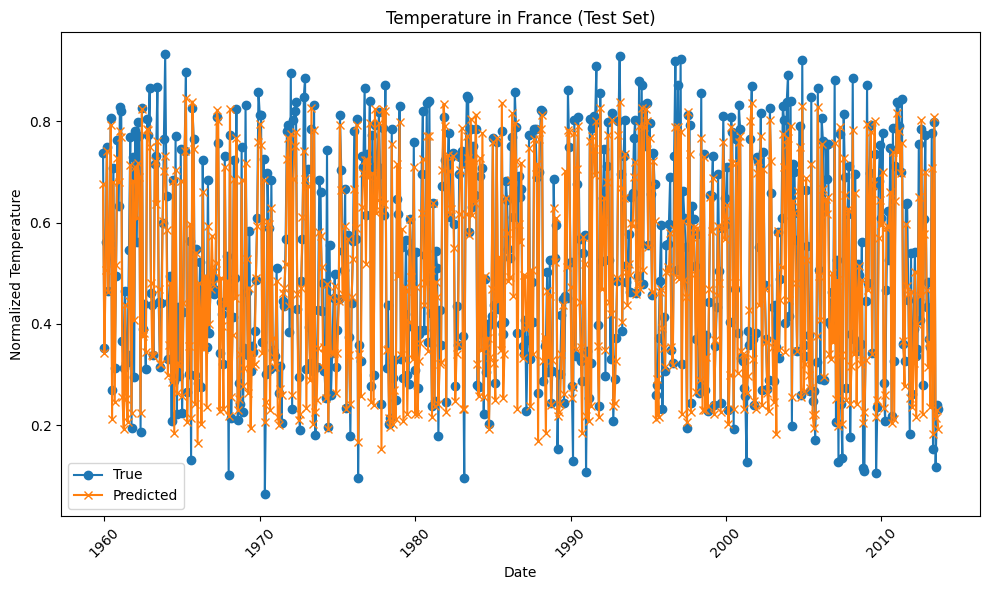

In [17]:
# first plot (very bad way to represent the data result) plot everything (normalize and all the data/prediction/true value)
plt.figure(figsize=(10, 6))
plt.plot(test_dates, true_values, label='True', marker='o')
plt.plot(test_dates, predictions, label='Predicted', marker='x')
plt.xlabel('Date')
plt.ylabel('Normalized Temperature')
plt.title('Temperature in France (Test Set)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [18]:
# Computes scalar similarity (cosine similarity) between true and predicted values.
# Higher values indicate that adversarial predictions remain directionally aligned
# with the true values, suggesting stealthy and rational attacks!
def scalar_similarity(y_true, y_pred):
    numerator = np.dot(y_true, y_pred)
    denominator = np.linalg.norm(y_true) * np.linalg.norm(y_pred)
    if denominator == 0:
        return 0.0
    return numerator / denominator

In [22]:
true_values_denorm = true_values * (max_temp - min_temp) + min_temp
predictions_denorm = predictions * (max_temp - min_temp) + min_temp

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

LSTM | NA – Epsilon 0.00 – MAE: 1.4697 | SIM: 0.9903


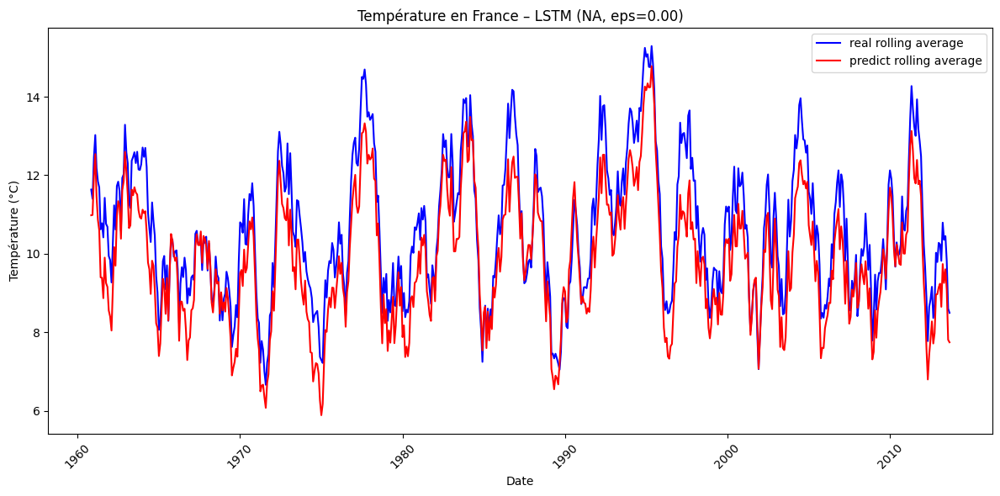

In [23]:
from utils.log_and_plot import log_and_plot_predictions

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='LSTM',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity
)

## Adversial part

In [24]:
# func for denormalize the data
def denormalize(data, min_val, max_val):
    return data * (max_val - min_val) + min_val

In [25]:
from attacks.fgsm import fgsm_attack
from attacks.bim import bim_attack
from attacks.tca import tca_attack

In [55]:
from attacks.run_attack import *

LSTM | FGSM – Epsilon 0.01 – Adversarial MAE: 1.8060 | SIM: 0.9870


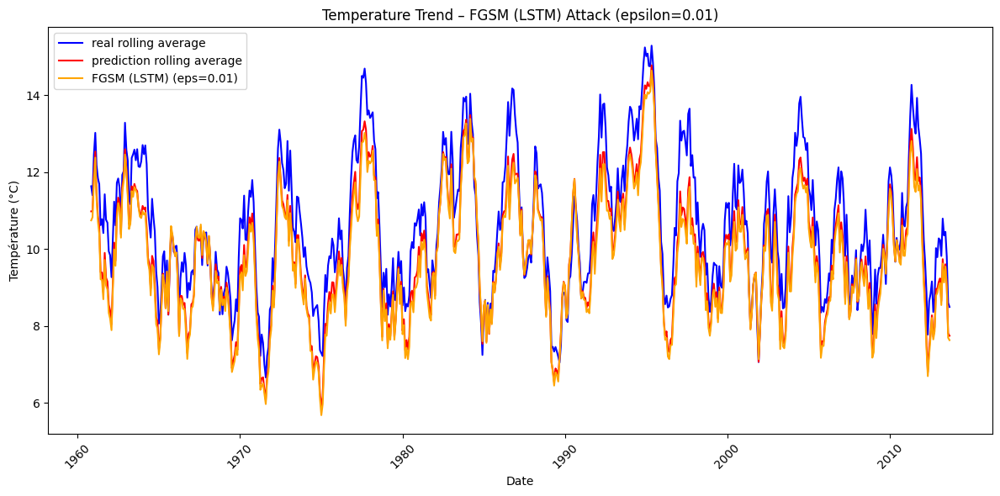

LSTM | FGSM – Epsilon 0.1 – Adversarial MAE: 4.7761 | SIM: 0.9140


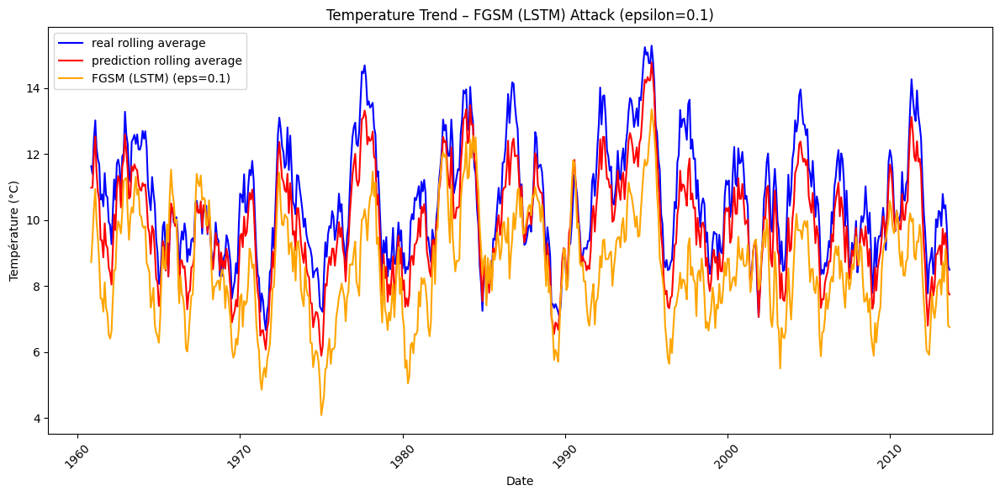

LSTM | FGSM – Epsilon 0.2 – Adversarial MAE: 7.8388 | SIM: 0.7522


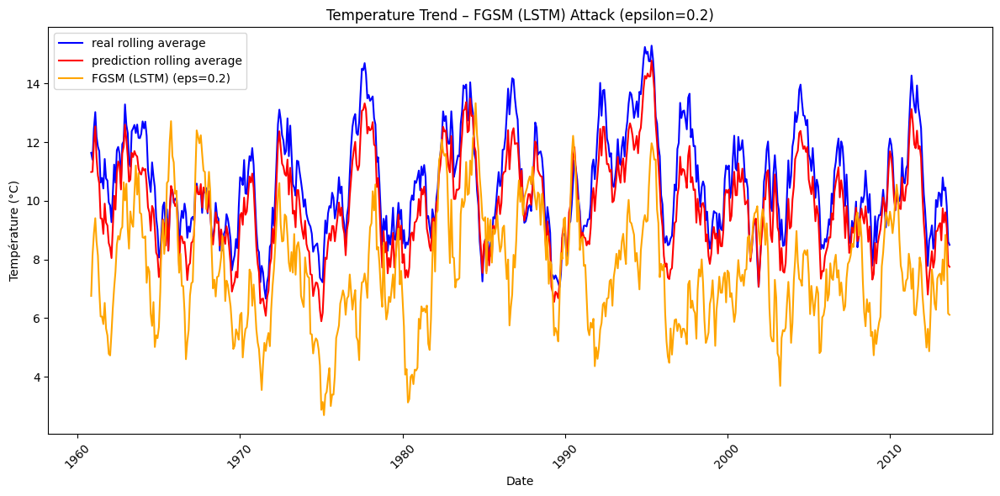

LSTM | BIM – Epsilon 0.01 – Adversarial MAE: 1.8058 | SIM: 0.9870


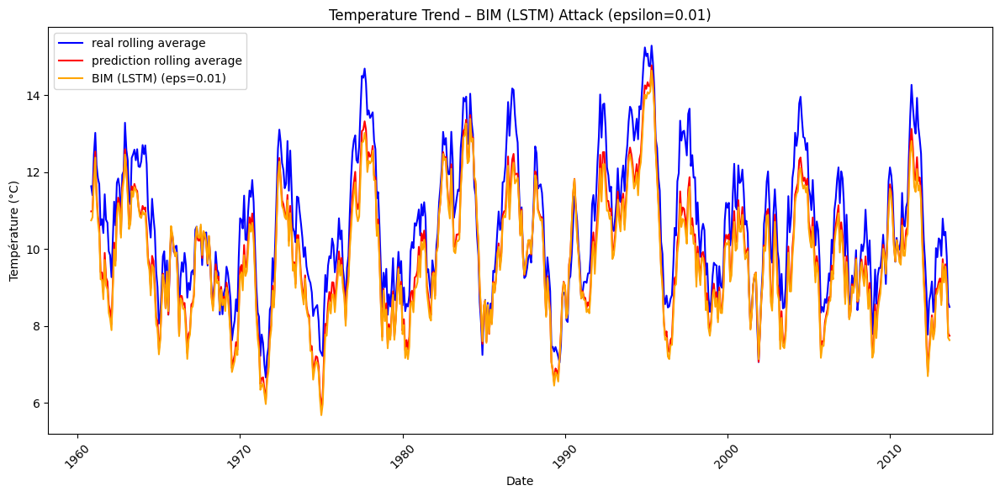

LSTM | BIM – Epsilon 0.1 – Adversarial MAE: 4.7764 | SIM: 0.9140


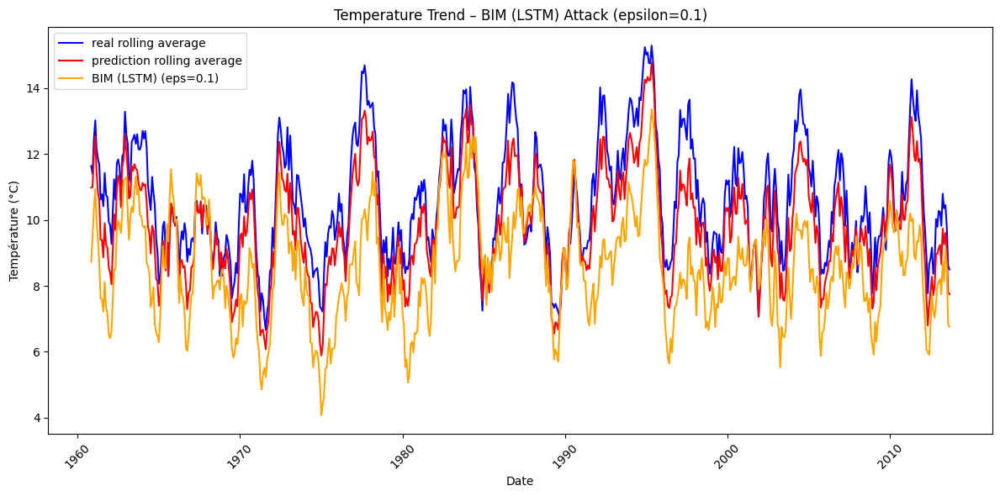

LSTM | BIM – Epsilon 0.2 – Adversarial MAE: 7.7977 | SIM: 0.7540


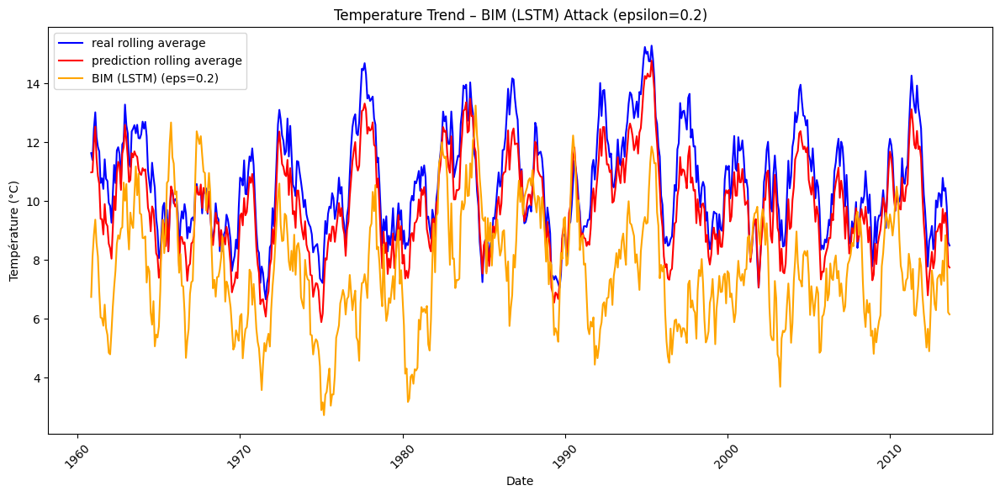

LSTM | TCA – Epsilon 0.01 – Adversarial MAE: 1.4663 | SIM: 0.9900


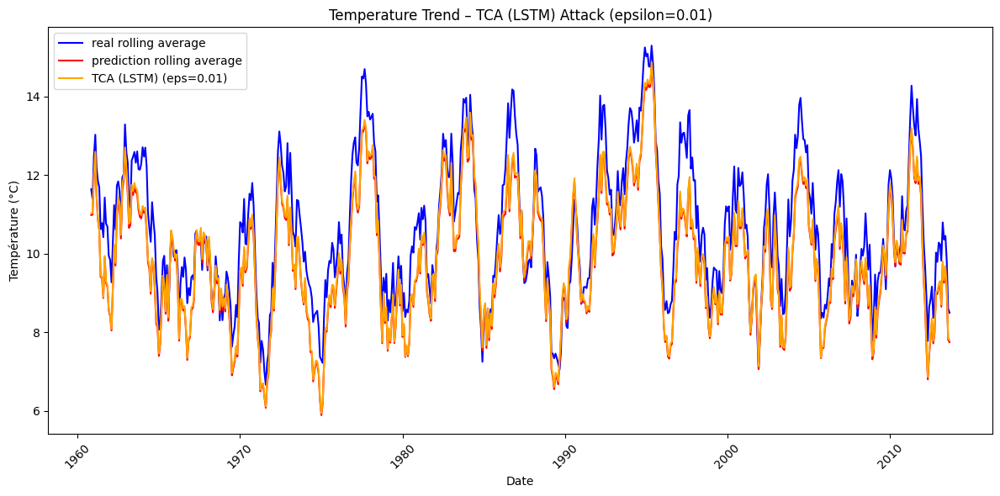

LSTM | TCA – Epsilon 0.1 – Adversarial MAE: 1.6300 | SIM: 0.9868


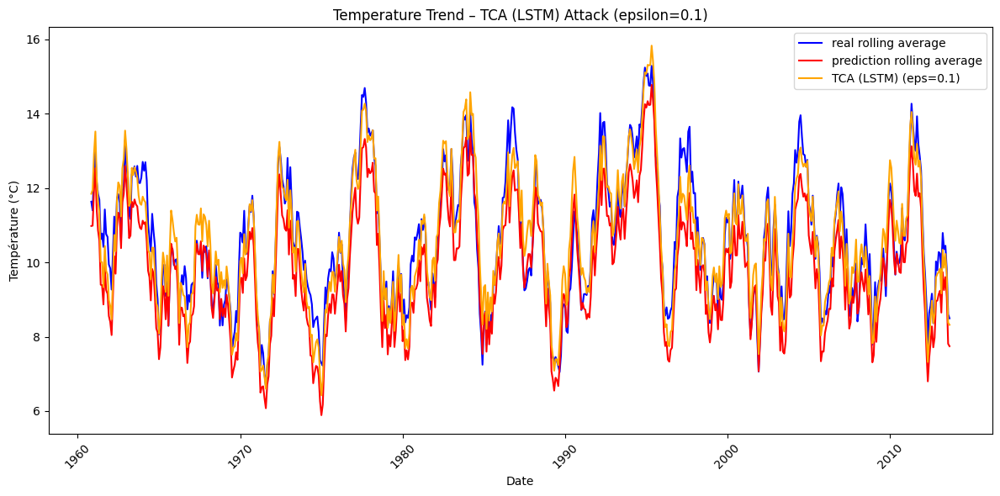

LSTM | TCA – Epsilon 0.2 – Adversarial MAE: 2.2656 | SIM: 0.9827


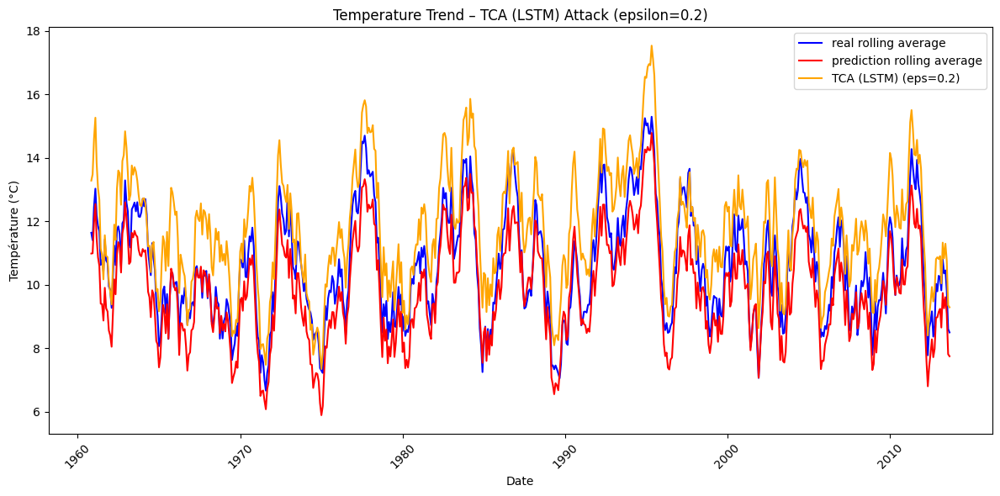

In [28]:
epsilon_values = [0.01, 0.1, 0.2]
alpha = 0.01
iters = 20

# FGSM
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


## RNN PART

In [29]:
from models.rnn import SimpleRNN

In [30]:
model_temp_RNN = SimpleRNN(input_size=1, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model_temp_RNN.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model_temp_RNN,loss_fn,optimizer,num_epochs,train_loader)

Epoch 1/10, Loss: 0.0344
Epoch 2/10, Loss: 0.0047
Epoch 3/10, Loss: 0.0042
Epoch 4/10, Loss: 0.0040
Epoch 5/10, Loss: 0.0039
Epoch 6/10, Loss: 0.0041
Epoch 7/10, Loss: 0.0040
Epoch 8/10, Loss: 0.0039
Epoch 9/10, Loss: 0.0040
Epoch 10/10, Loss: 0.0039


In [31]:
from utils.eval import evaluate_model

model_temp_RNN.eval()
results = evaluate_model(model_temp_RNN, test_loader, train_size, dates)
test_dates = results["test_dates"]
true_values = results["true_values"]
predictions = results["predictions"]
for name, value in results["metrics"].items():
    print(f"{name}: {value:.4f}")

MAE: 0.0514
MSE: 0.0041
RMSE: 0.0640
R2: 0.9130


RNN | NA – Epsilon 0.00 – MAE: 1.3617 | SIM: 0.9904


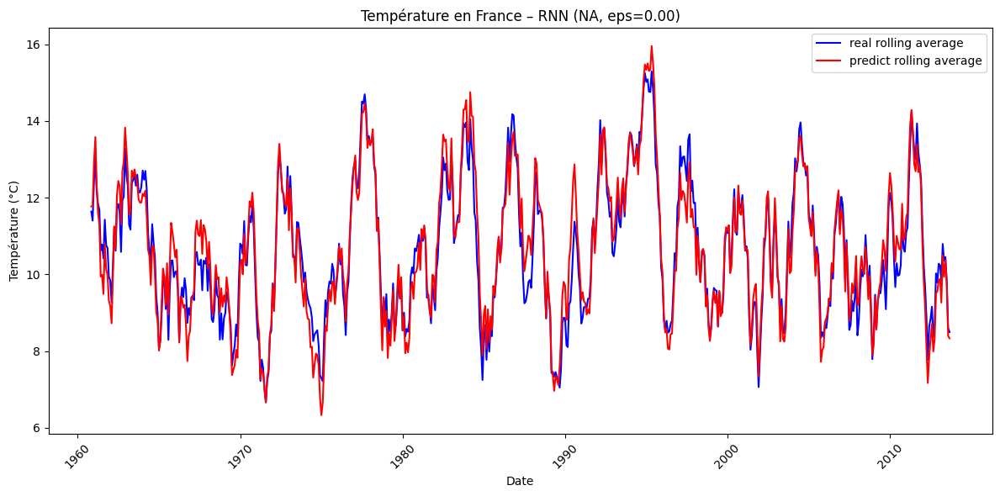

In [32]:
true_values_denorm = true_values * (max_temp - min_temp) + min_temp
predictions_denorm = predictions * (max_temp - min_temp) + min_temp

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='RNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity
)

RNN | FGSM – Epsilon 0.01 – Adversarial MAE: 1.7138 | SIM: 0.9869


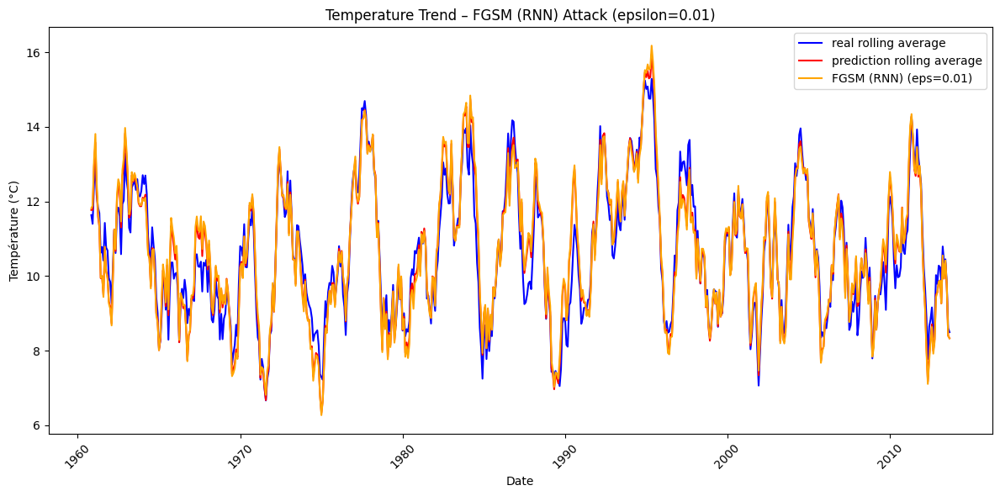

RNN | FGSM – Epsilon 0.1 – Adversarial MAE: 4.7797 | SIM: 0.9282


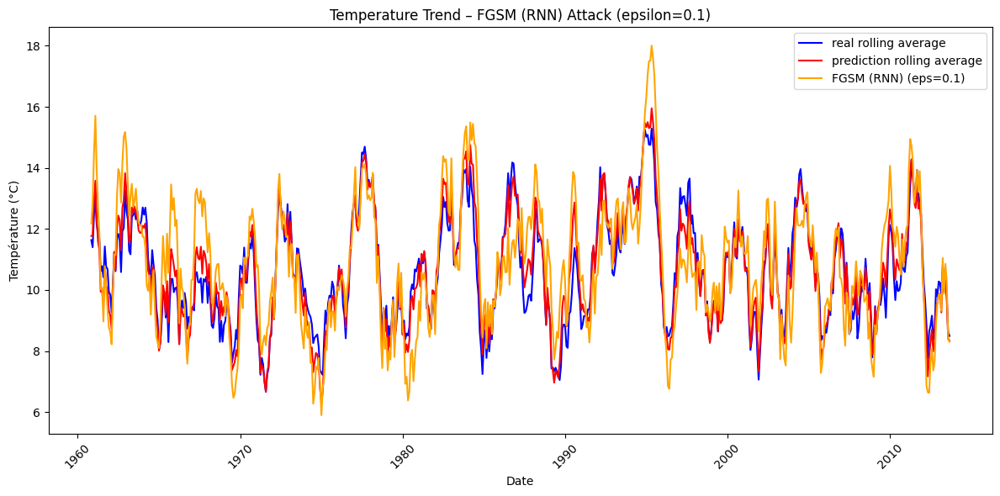

RNN | FGSM – Epsilon 0.2 – Adversarial MAE: 7.8568 | SIM: 0.8346


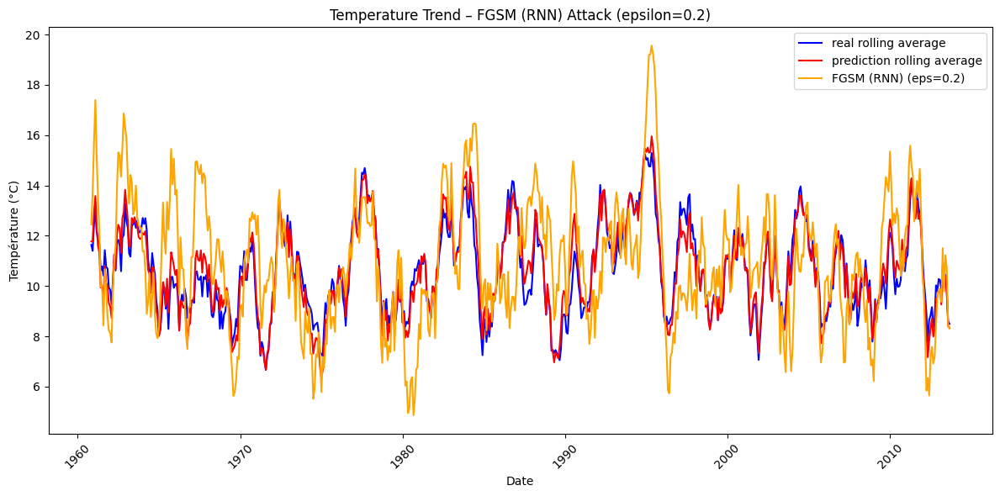

RNN | BIM – Epsilon 0.01 – Adversarial MAE: 1.7137 | SIM: 0.9869


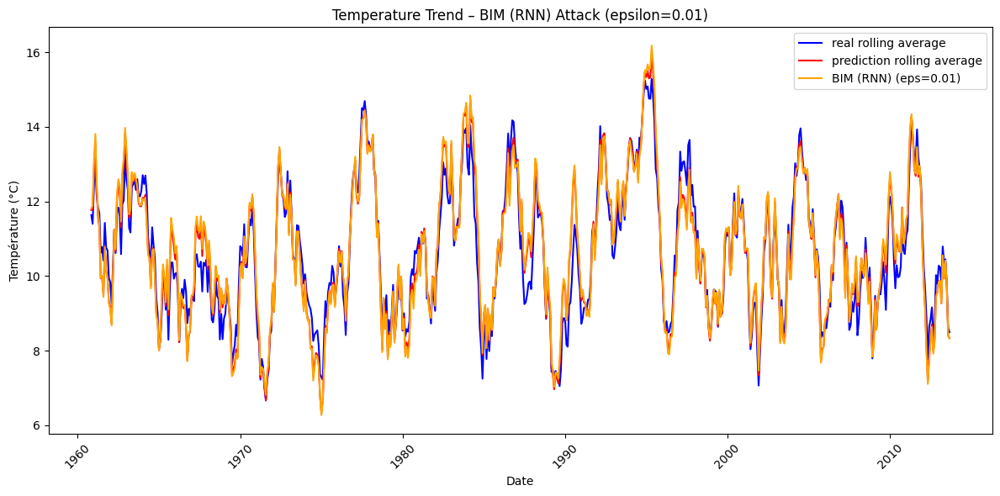

RNN | BIM – Epsilon 0.1 – Adversarial MAE: 4.7924 | SIM: 0.9279


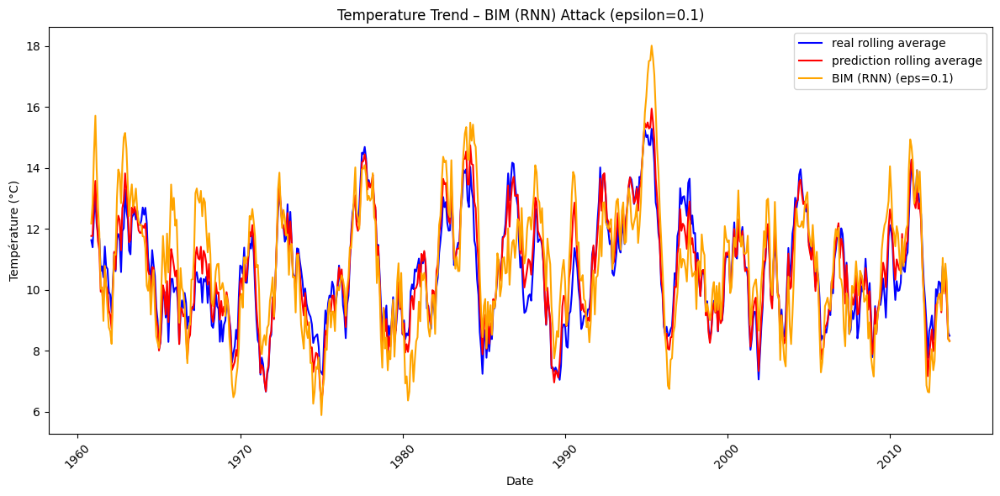

RNN | BIM – Epsilon 0.2 – Adversarial MAE: 7.8502 | SIM: 0.8333


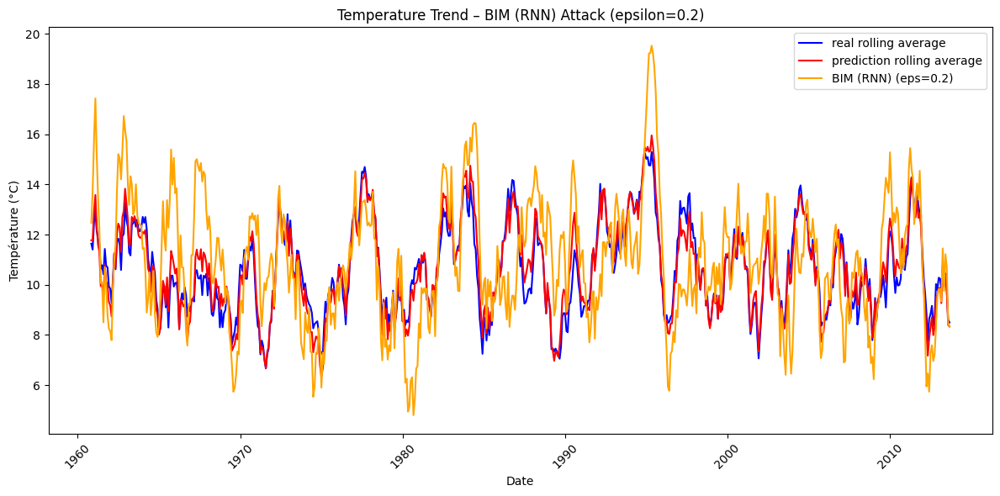

RNN | TCA – Epsilon 0.01 – Adversarial MAE: 1.4088 | SIM: 0.9902


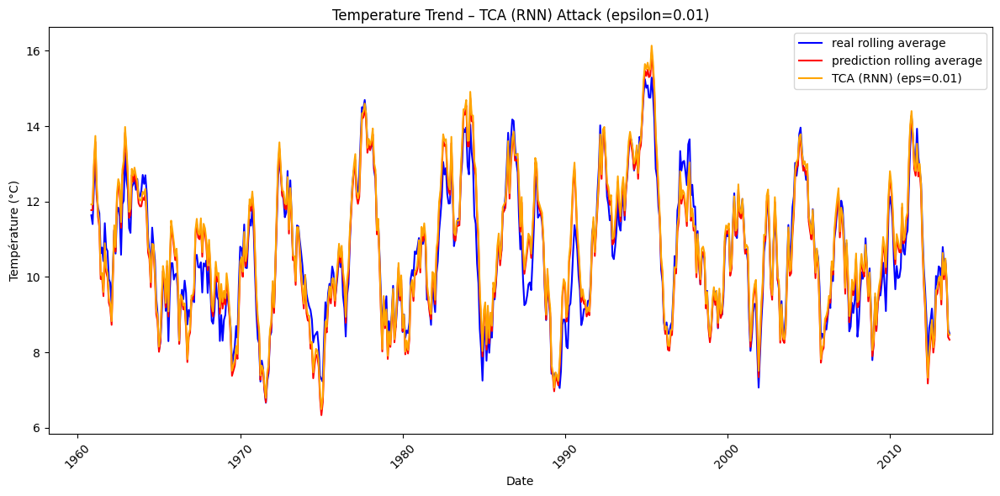

RNN | TCA – Epsilon 0.1 – Adversarial MAE: 2.1879 | SIM: 0.9887


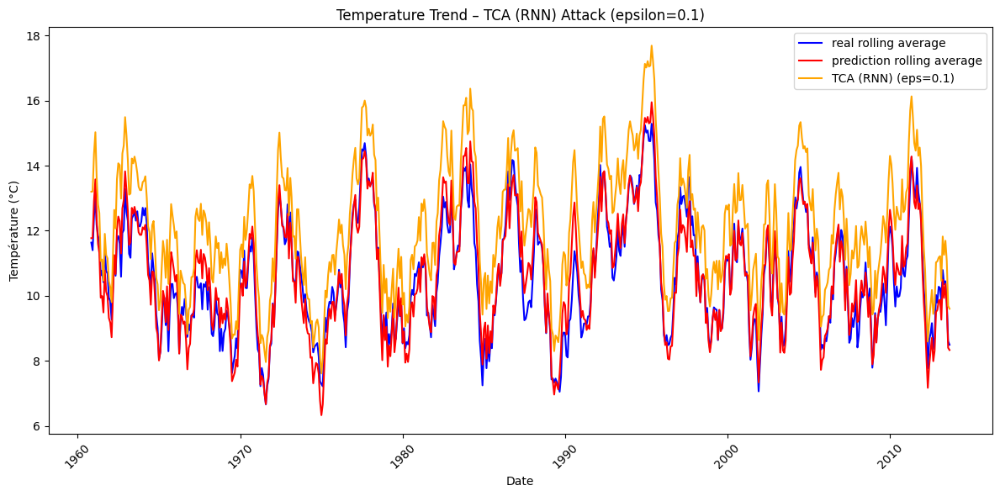

RNN | TCA – Epsilon 0.2 – Adversarial MAE: 3.4944 | SIM: 0.9878


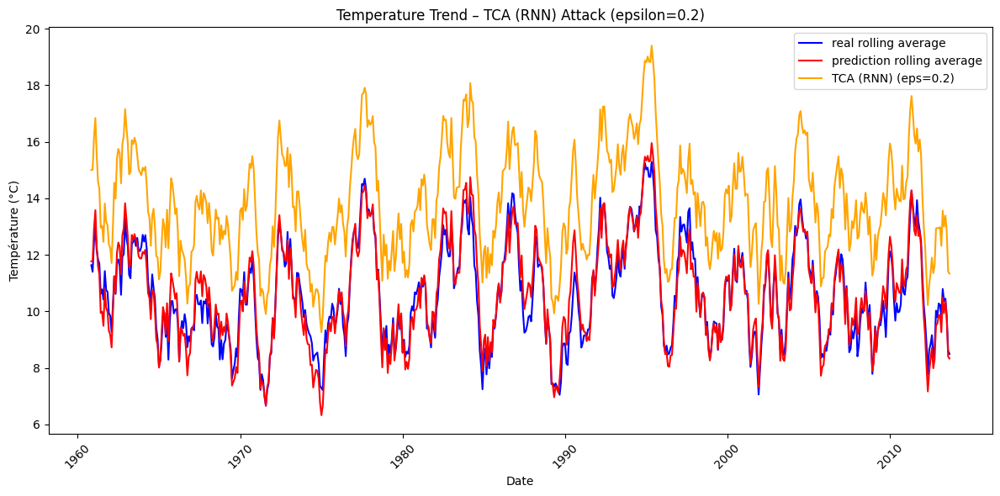

In [34]:
# FGSM
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


## CNN PART

In [35]:
from models.cnn import SimpleCNN

In [36]:
model_temp_CNN = SimpleCNN(input_channels=1, output_size=1)
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model_temp_CNN.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model_temp_CNN,loss_fn,optimizer,num_epochs,train_loader)

Epoch 1/10, Loss: 0.0562
Epoch 2/10, Loss: 0.0185
Epoch 3/10, Loss: 0.0140
Epoch 4/10, Loss: 0.0135
Epoch 5/10, Loss: 0.0134
Epoch 6/10, Loss: 0.0129
Epoch 7/10, Loss: 0.0125
Epoch 8/10, Loss: 0.0122
Epoch 9/10, Loss: 0.0119
Epoch 10/10, Loss: 0.0116


In [37]:
from utils.eval import evaluate_model

model_temp_CNN.eval()
results = evaluate_model(model_temp_CNN, test_loader, train_size, dates)
test_dates = results["test_dates"]
true_values = results["true_values"]
predictions = results["predictions"]
for name, value in results["metrics"].items():
    print(f"{name}: {value:.4f}")

MAE: 0.0698
MSE: 0.0112
RMSE: 0.1060
R2: 0.7612


CNN | NA – Epsilon 0.00 – MAE: 1.8482 | SIM: 0.9724


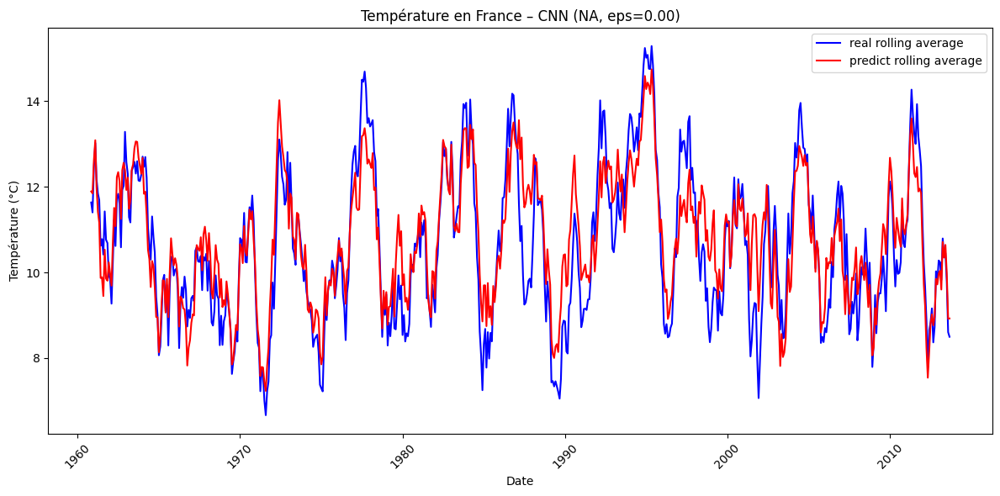

In [38]:
true_values_denorm = true_values * (max_temp - min_temp) + min_temp
predictions_denorm = predictions * (max_temp - min_temp) + min_temp

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='CNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity
)

CNN | FGSM – Epsilon 0.01 – Adversarial MAE: 2.2664 | SIM: 0.9663


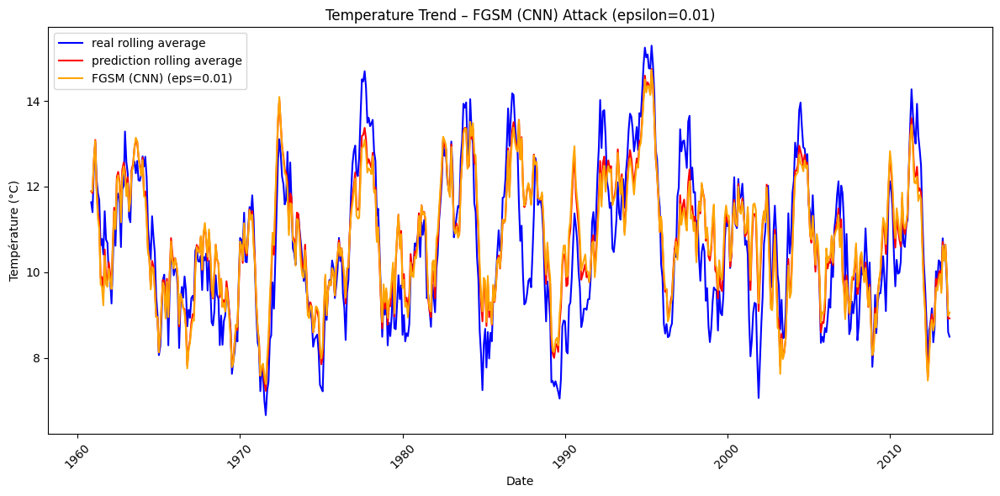

CNN | FGSM – Epsilon 0.1 – Adversarial MAE: 6.1282 | SIM: 0.8549


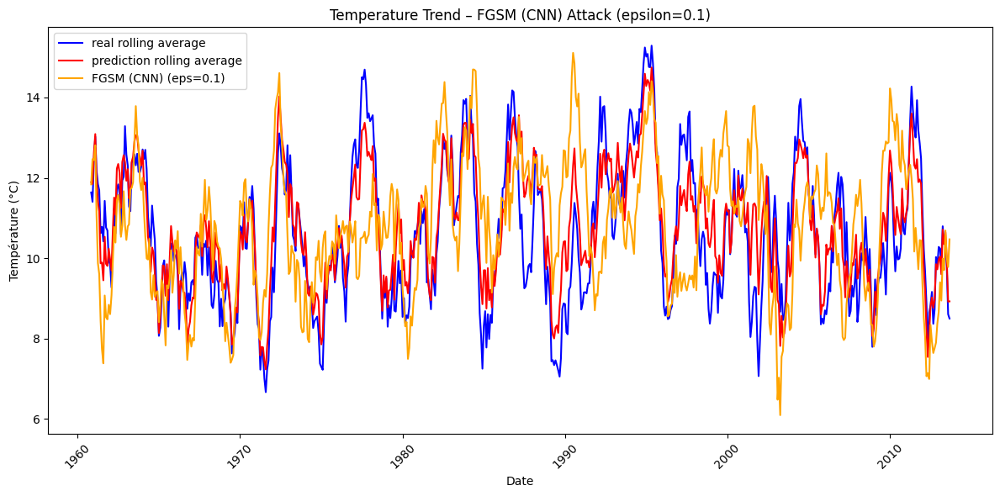

CNN | FGSM – Epsilon 0.2 – Adversarial MAE: 10.2712 | SIM: 0.6708


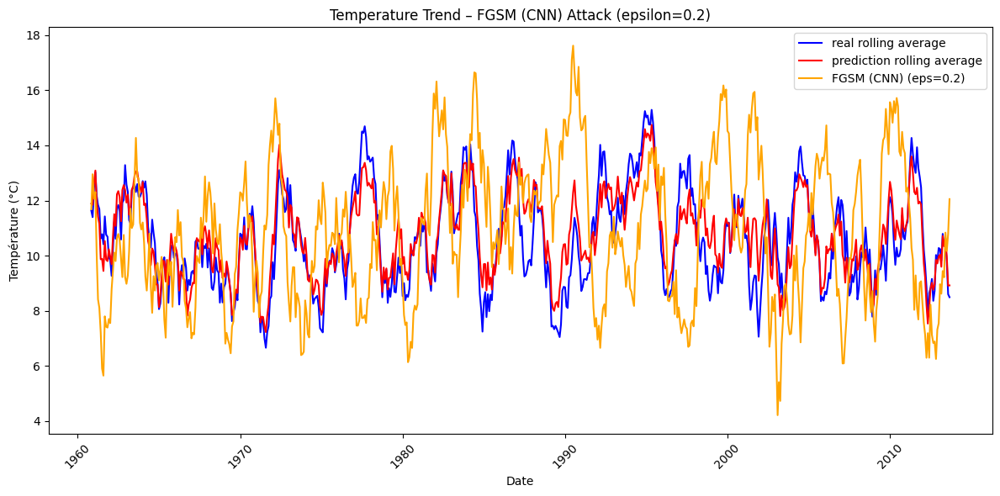

CNN | BIM – Epsilon 0.01 – Adversarial MAE: 2.2665 | SIM: 0.9663


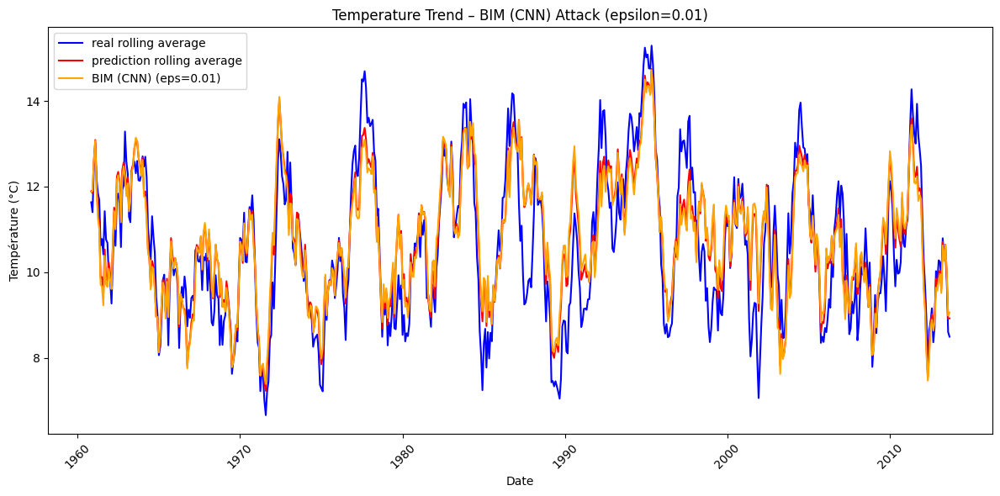

CNN | BIM – Epsilon 0.1 – Adversarial MAE: 6.1658 | SIM: 0.8535


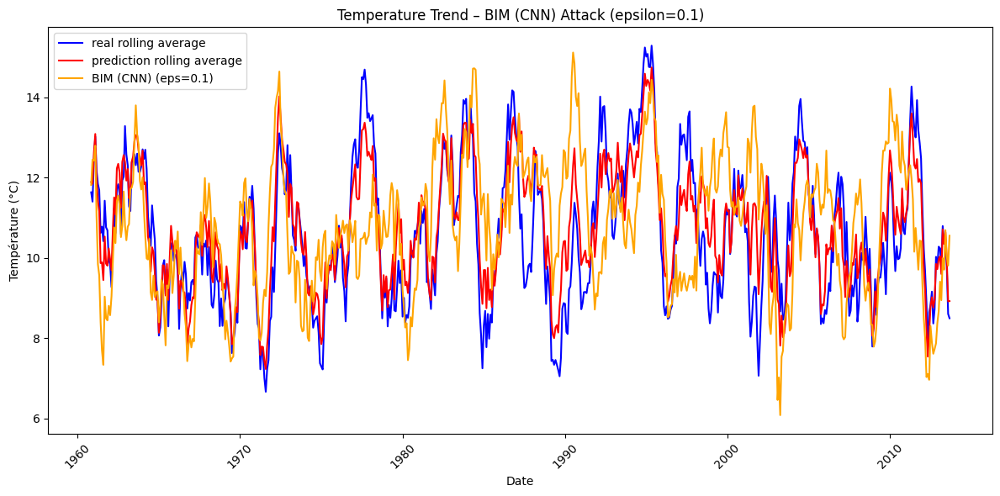

CNN | BIM – Epsilon 0.2 – Adversarial MAE: 10.3209 | SIM: 0.6670


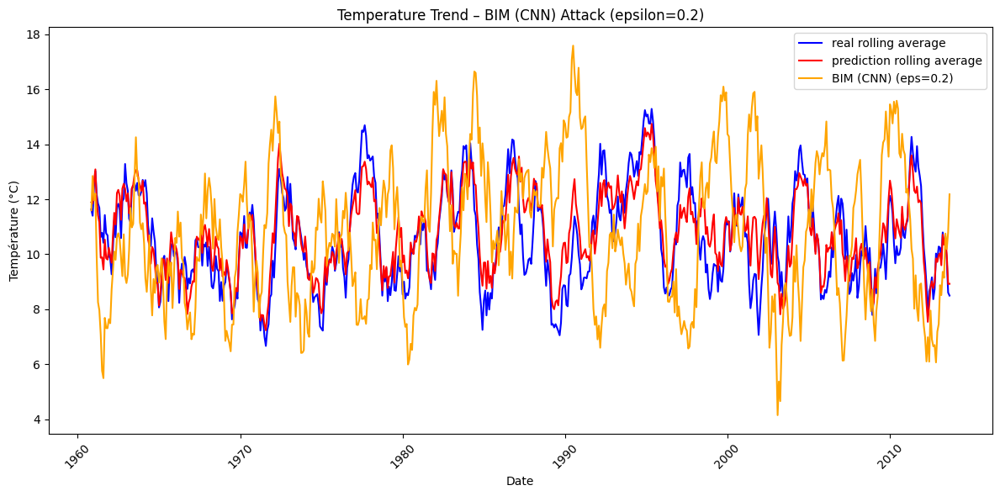

CNN | TCA – Epsilon 0.01 – Adversarial MAE: 1.9121 | SIM: 0.9720


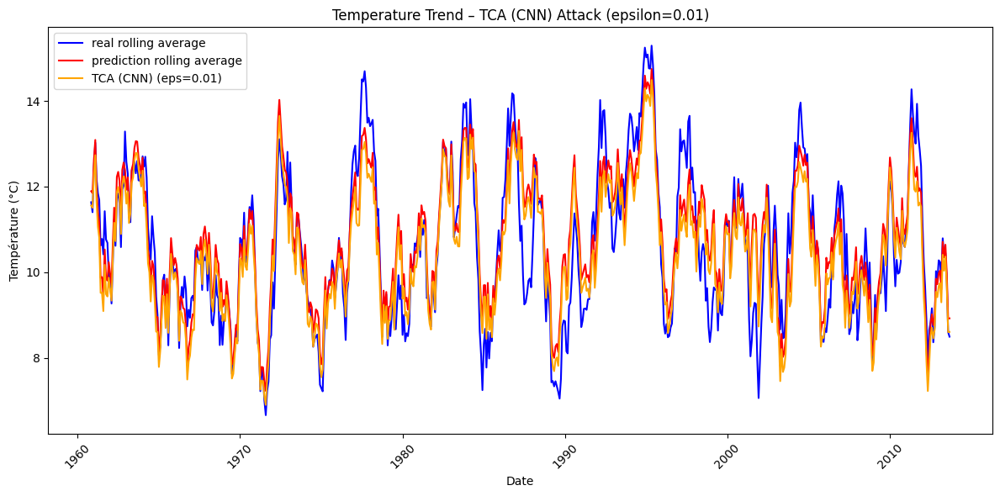

CNN | TCA – Epsilon 0.1 – Adversarial MAE: 3.8768 | SIM: 0.9581


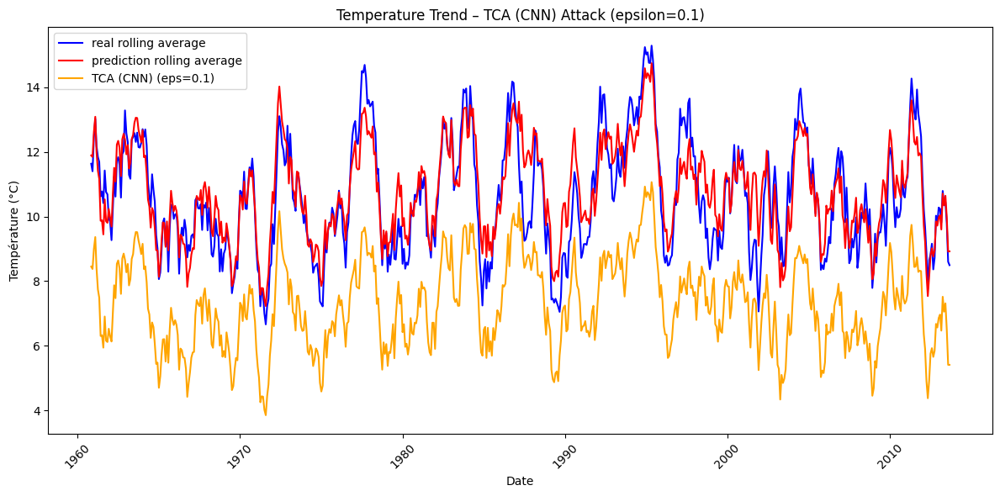

CNN | TCA – Epsilon 0.2 – Adversarial MAE: 7.1301 | SIM: 0.8802


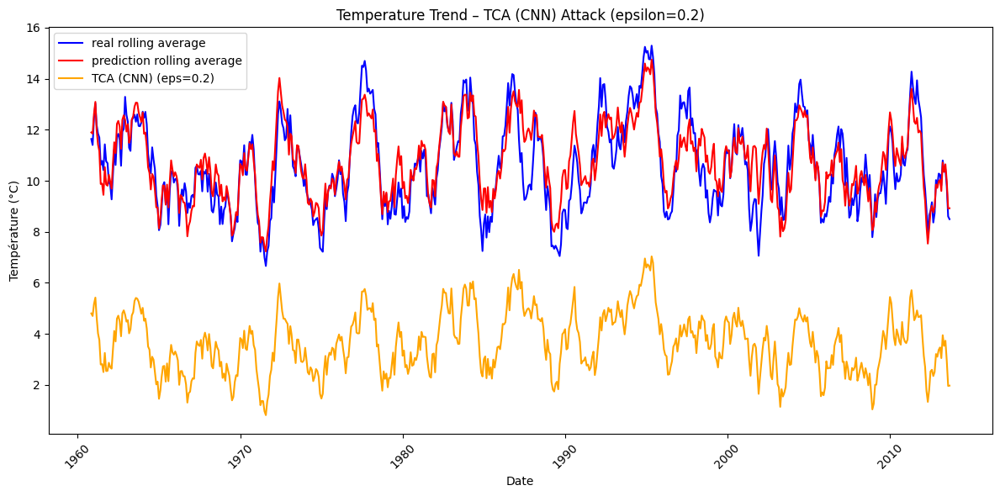

In [39]:
# FGSM
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, min_temp, max_temp, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


In [40]:
display(res_tab_temp)

Attack              NA      FGSM                            BIM            \
ε                 0.00      0.01      0.10       0.20      0.01      0.10   
Model Metric                                                                
LSTM  MAE     1.469655  1.806011  4.776139   7.838787  1.805790  4.776423   
      RSME    1.817161  2.099369  4.936586   8.034160  2.099182  4.936403   
      SIM     0.990299  0.986966  0.914041   0.752208  0.986970  0.914045   
RNN   MAE     1.361713  1.713806  4.779726   7.856816  1.713661  4.792407   
      RSME    1.695072  1.987921  4.901278   7.993115  1.987746  4.913224   
      SIM     0.990402  0.986916  0.928209   0.834635  0.986918  0.927853   
CNN   MAE     1.848151  2.266361  6.128210  10.271235  2.266484  6.165822   
      RSME    2.807991  3.102176  6.516601  10.582232  3.102243  6.550355   
      SIM     0.972419  0.966257  0.854881   0.670832  0.966255  0.853513   

Attack                        TCA                      
ε                  0.20      0.01      0.10      0.20  
Model Metric                                           
LSTM  MAE      7.797707  1.466333  1.630041  2.265564  
      RSME     7.998198  1.809599  1.953495  2.664812  
      SIM      0.754023  0.990004  0.986784  0.982676  
RNN   MAE      7.850226  1.408844  2.187857  3.494355  
      RSME     7.997091  1.743512  2.525273  3.819416  
      SIM      0.833309  0.990221  0.988688  0.987834  
CNN   MAE     10.320863  1.912057  3.876834  7.130084  
      RSME    10.627615  2.832028  4.496507  7.651233  
      SIM      0.667025  0.972003  0.958146  0.880245

The fact that there is a translation is good, because it implies that I satisfied the three main components mentioned in the paper:

*    Effectiveness

*    Stealthiness

*    Rationality


## Analysis and Question

* Something really strange is that both attacks (FGSM/BIM) have the same MAE/RSME value.
Does this imply that, under certain conditions, a BIM attack behaves just like an FGSM attack, since BIM is essentially multiple iterations of FGSM? I see on the paper (https://www.sciencedirect.com/science/article/abs/pii/S0957417424028173) that BIM get lot more MAE/RSME than FGSM so maybe the implementation of BIM is not good ?

* In a non-targeted TCA adversarial attack on stock data, why does the perturbation mainly manifest as a uniform upward shift (translation upwards)? Intuitively, since the attack’s goal is to just maximize the model’s loss without targeting a specific output, I would expect the perturbation to sometimes push predictions downwards or create more varied fluctuations. Why does the perturbation tend to be an increase rather than a decrease or a mix? I think maybe i get a miss understand of how TCA really work? After implementing CNN, it clear that i dont know why but now the translation is down shift??? So maybe I need one more time to look at the TCA attack to be sure that nothing is wrong in my implementation.

# SAME BUT WITH GOOGLE STOCK DATA

## LSMT PART

In [41]:
google_data = pd.read_csv("data/HistoricalData_1747091015337.csv")
google_data['Date'] = pd.to_datetime(google_data['Date'])
google_data = google_data.sort_values(by='Date')

In [42]:
from utils.google_stock.setup_google_stock_dataset import prepare_stock_dataset
sequence_length = 30
result = prepare_stock_dataset(google_data)

train_loader = result['train_loader']
val_loader = result['val_loader']
test_loader = result['test_loader']
train_size = result['train_size']
val_size = result['val_size']
min_max = result['min_max']
dates = result['dates']
price_min, price_max = min_max['Close/Last']


In [43]:
from utils.google_stock.train_with_validation import train_model_with_validation
model_google = SimpleLSTM(input_size=5, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google.parameters(), lr=0.01)
num_epochs = 10
train_model_with_validation(model_google, loss_fn, optimizer, num_epochs, train_loader, val_loader,sequence_length)

Epoch [1/10], Train Loss: 0.0941, Validation Loss: 0.0125
Epoch [2/10], Train Loss: 0.0053, Validation Loss: 0.0018
Epoch [3/10], Train Loss: 0.0017, Validation Loss: 0.0013
Epoch [4/10], Train Loss: 0.0013, Validation Loss: 0.0014
Epoch [5/10], Train Loss: 0.0013, Validation Loss: 0.0009
Epoch [6/10], Train Loss: 0.0011, Validation Loss: 0.0010
Epoch [7/10], Train Loss: 0.0010, Validation Loss: 0.0009
Epoch [8/10], Train Loss: 0.0013, Validation Loss: 0.0009
Epoch [9/10], Train Loss: 0.0009, Validation Loss: 0.0010
Epoch [10/10], Train Loss: 0.0012, Validation Loss: 0.0013


In [44]:
from utils.google_stock.google_eval import evaluate_model_google
results = evaluate_model_google(model_google, test_loader, dates, train_size, val_size)

real_values = results['real_values']
predicted_values = results['predicted_values']
test_dates = results['test_dates']


In [45]:
# Creation of the tab result for plotting adversial attack result
models = ['LSTM','RNN']
metrics = ['MAE', "RSME", 'SIM']

row_index = pd.MultiIndex.from_product([models, metrics], names=['Model', 'Metric'])

attacks = ['NA', 'FGSM', 'BIM', 'TCA']
epsilons = {
    'NA': [0],
    'FGSM': [0.01, 0.1, 0.2],
    'BIM': [0.01, 0.1, 0.2],
    'TCA': [0.01, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

print(res_tab)

Attack         NA FGSM            BIM            TCA          
ε            0.00 0.01 0.10 0.20 0.01 0.10 0.20 0.01 0.10 0.20
Model Metric                                                  
LSTM  MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN


LSTM | NA – Epsilon 0.00 – MAE: 3.8636 | SIM: 0.9996


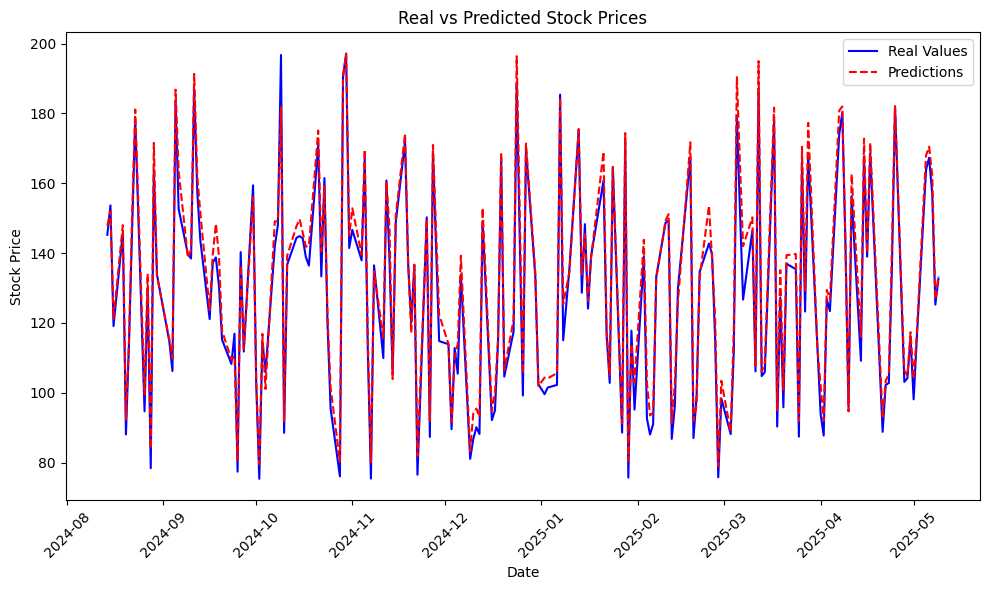

In [46]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='LSTM',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity,
    google=True
)

FGSM – Epsilon 0.01 – Adversarial MAE: 5.2887 | SIM: 0.9994


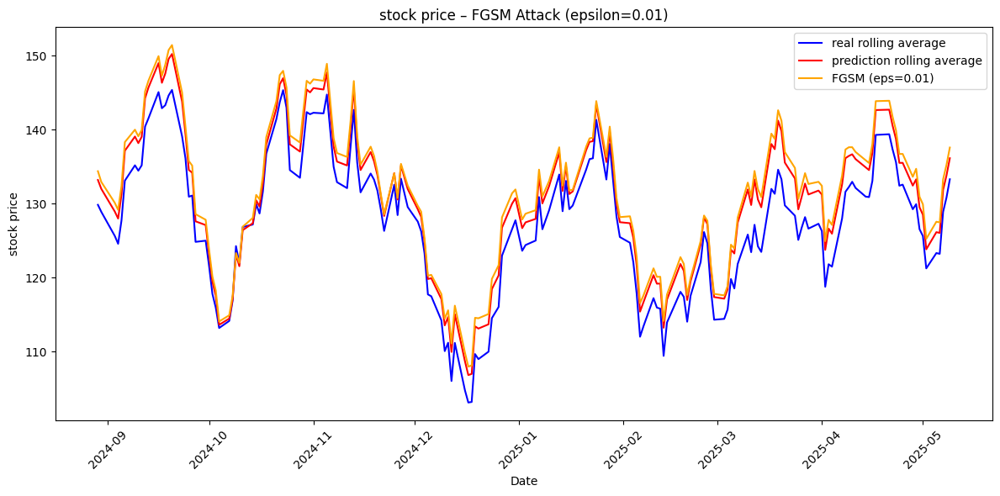

FGSM – Epsilon 0.1 – Adversarial MAE: 18.1081 | SIM: 0.9955


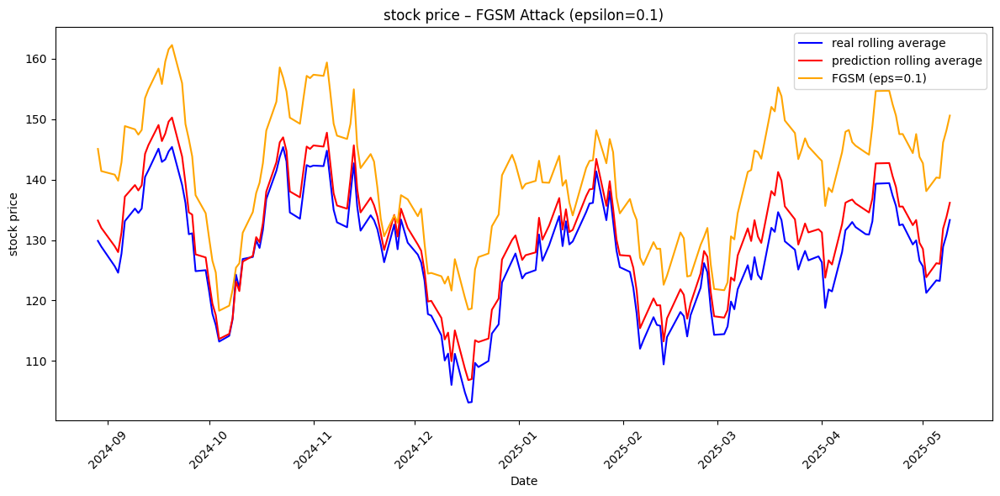

FGSM – Epsilon 0.2 – Adversarial MAE: 32.2066 | SIM: 0.9875


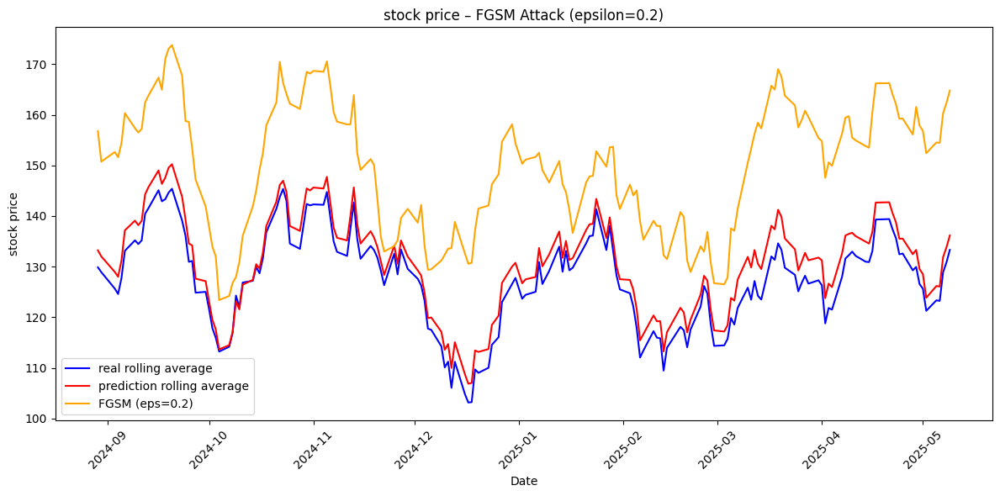

BIM – Epsilon 0.01 – Adversarial MAE: 5.2873 | SIM: 0.9994


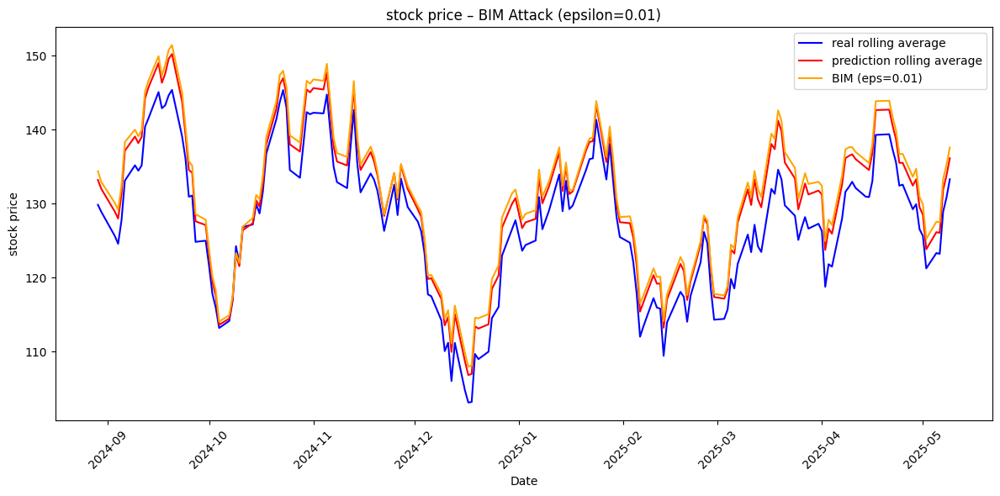

BIM – Epsilon 0.1 – Adversarial MAE: 18.0602 | SIM: 0.9955


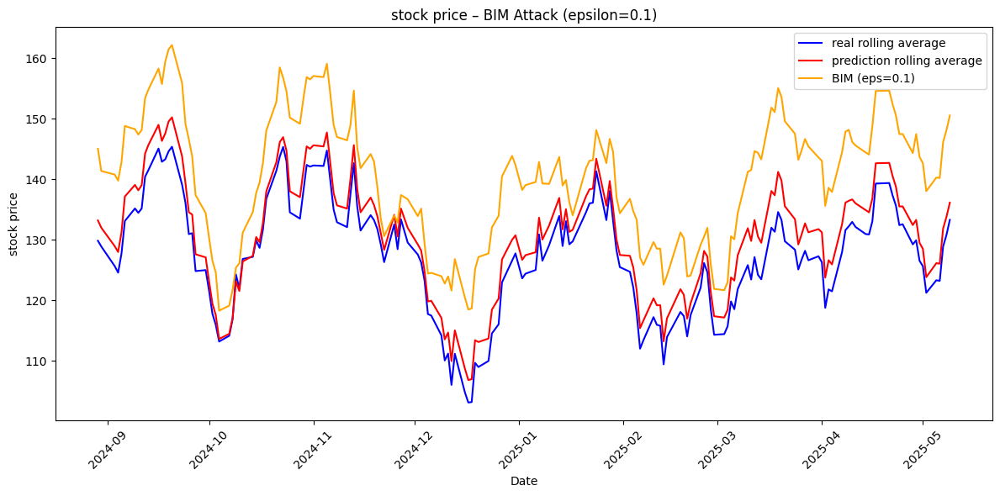

BIM – Epsilon 0.2 – Adversarial MAE: 31.6637 | SIM: 0.9874


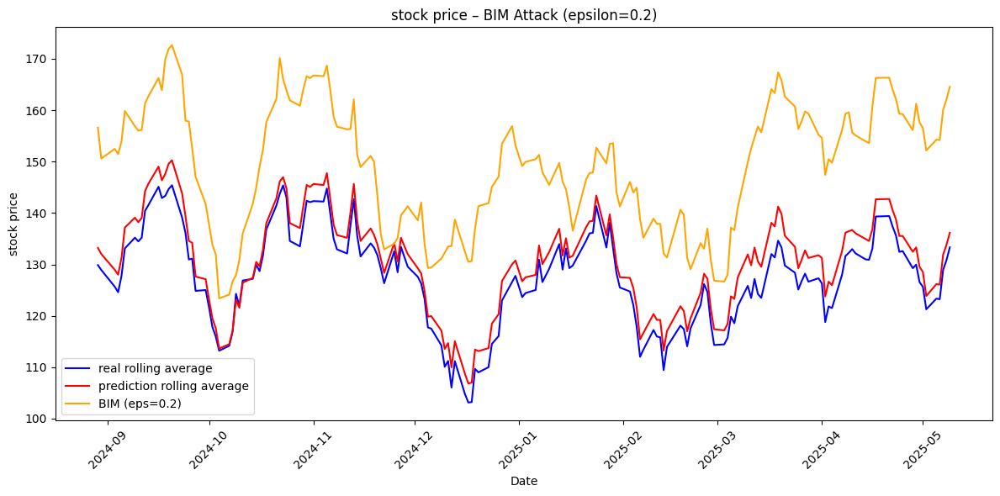

In [47]:
# just some test of adersial attack on google stock data set
# not the result on the result tab
from utils.google_stock.plot_attack_google import plot_rolling_attacks_google
epsilon_values = [0.01, 0.1, 0.2]
alpha = 0.01
iters = 40

# FGSM
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, fgsm_attack, epsilon=eps)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"FGSM – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="FGSM", eps=eps)

# BIM
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, bim_attack, epsilon=eps, alpha=alpha, num_iter=iters)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"BIM – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="BIM", eps=eps)

TCA – Epsilon 0.01 – Adversarial MAE: 4.8798 | SIM: 0.9996


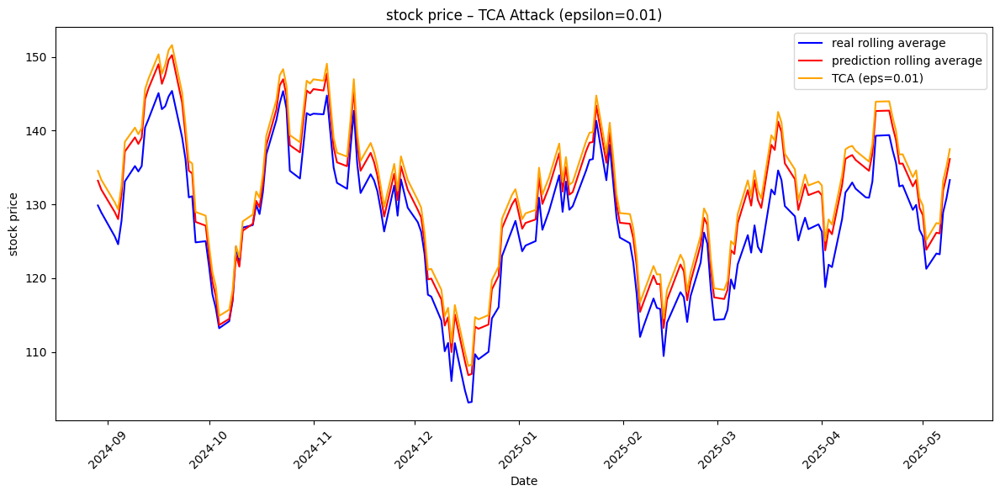

TCA – Epsilon 0.1 – Adversarial MAE: 16.4244 | SIM: 0.9993


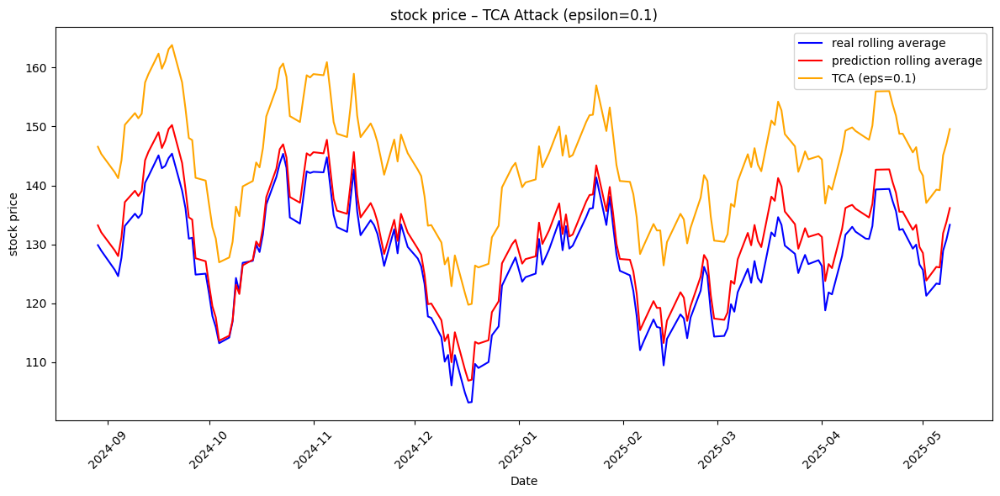

TCA – Epsilon 0.2 – Adversarial MAE: 29.6767 | SIM: 0.9987


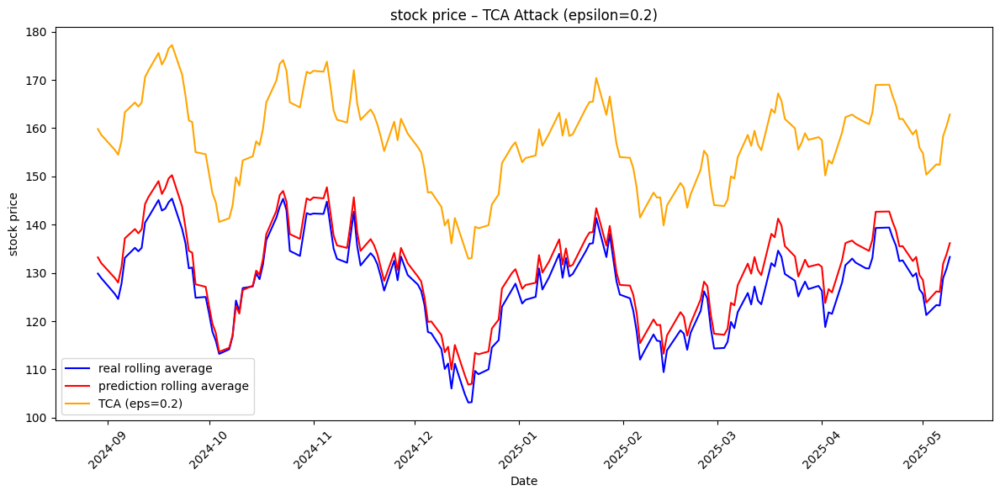

In [48]:
# TCA
epsilon_values = [0.01, 0.1, 0.2]
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, tca_attack, epsilon=eps)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"TCA – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="TCA", eps=eps)

FGSM – Epsilon 0.01 – MAE: 5.2887 | SIM: 0.9994 | RSME: 6.0238
BIM – Epsilon 0.01 – MAE: 5.2873 | SIM: 0.9994 | RSME: 6.0219
TCA – Epsilon 0.01 – MAE: 4.8798 | SIM: 0.9996 | RSME: 5.7713


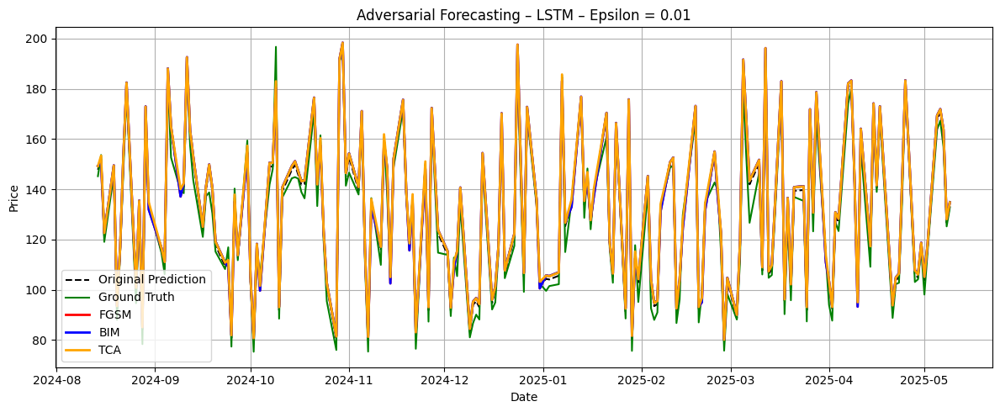

FGSM – Epsilon 0.10 – MAE: 18.1081 | SIM: 0.9955 | RSME: 18.3425
BIM – Epsilon 0.10 – MAE: 18.0599 | SIM: 0.9955 | RSME: 18.2989
TCA – Epsilon 0.10 – MAE: 16.4244 | SIM: 0.9993 | RSME: 16.8061


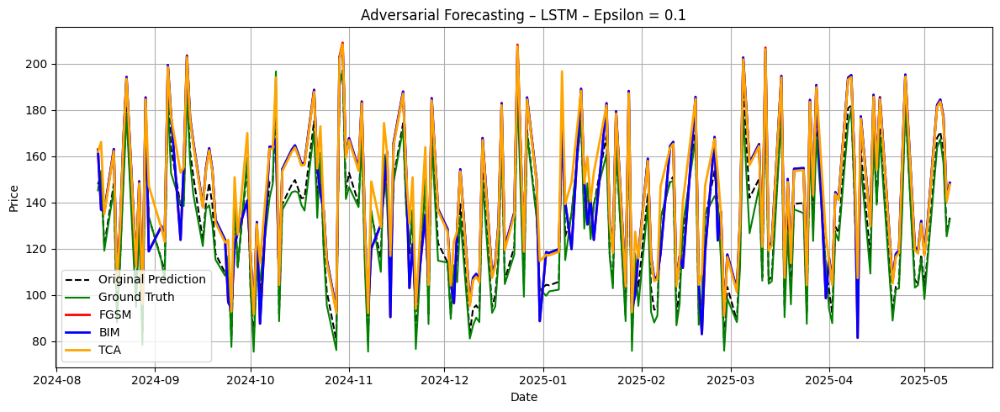

FGSM – Epsilon 0.20 – MAE: 32.2066 | SIM: 0.9875 | RSME: 32.3644
BIM – Epsilon 0.20 – MAE: 31.6636 | SIM: 0.9874 | RSME: 31.9156
TCA – Epsilon 0.20 – MAE: 29.6767 | SIM: 0.9987 | RSME: 29.9237


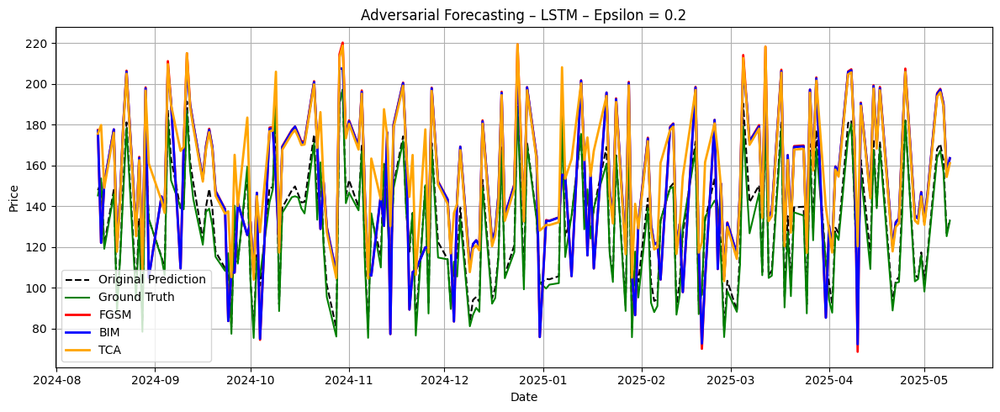

In [56]:
run_and_log_attack_google(
    model=model_google,
    model_name='LSTM',
    loss_fn=loss_fn,
    test_loader=test_loader,
    test_dates=test_dates,
    predictions_denorm=predictions_denorm,
    true_values_denorm=true_values_denorm,
    price_min=price_min,
    price_max=price_max,
    res_tab=res_tab
)


## RNN PART

In [57]:
model_google_RNN = SimpleRNN(input_size=5, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google_RNN.parameters(), lr=0.01)
num_epochs = 10
train_model_with_validation(model_google_RNN, loss_fn, optimizer, num_epochs, train_loader, val_loader,sequence_length)

Epoch [1/10], Train Loss: 0.0849, Validation Loss: 0.0251
Epoch [2/10], Train Loss: 0.0118, Validation Loss: 0.0015
Epoch [3/10], Train Loss: 0.0010, Validation Loss: 0.0010
Epoch [4/10], Train Loss: 0.0007, Validation Loss: 0.0009
Epoch [5/10], Train Loss: 0.0007, Validation Loss: 0.0008
Epoch [6/10], Train Loss: 0.0007, Validation Loss: 0.0010
Epoch [7/10], Train Loss: 0.0007, Validation Loss: 0.0006
Epoch [8/10], Train Loss: 0.0008, Validation Loss: 0.0018
Epoch [9/10], Train Loss: 0.0011, Validation Loss: 0.0012
Epoch [10/10], Train Loss: 0.0007, Validation Loss: 0.0007


In [58]:
from utils.google_stock.google_eval import evaluate_model_google
results = evaluate_model_google(model_google_RNN, test_loader, dates, train_size, val_size)

real_values = results['real_values']
predicted_values = results['predicted_values']
test_dates = results['test_dates']

RNN | NA – Epsilon 0.00 – MAE: 2.4269 | SIM: 0.9997


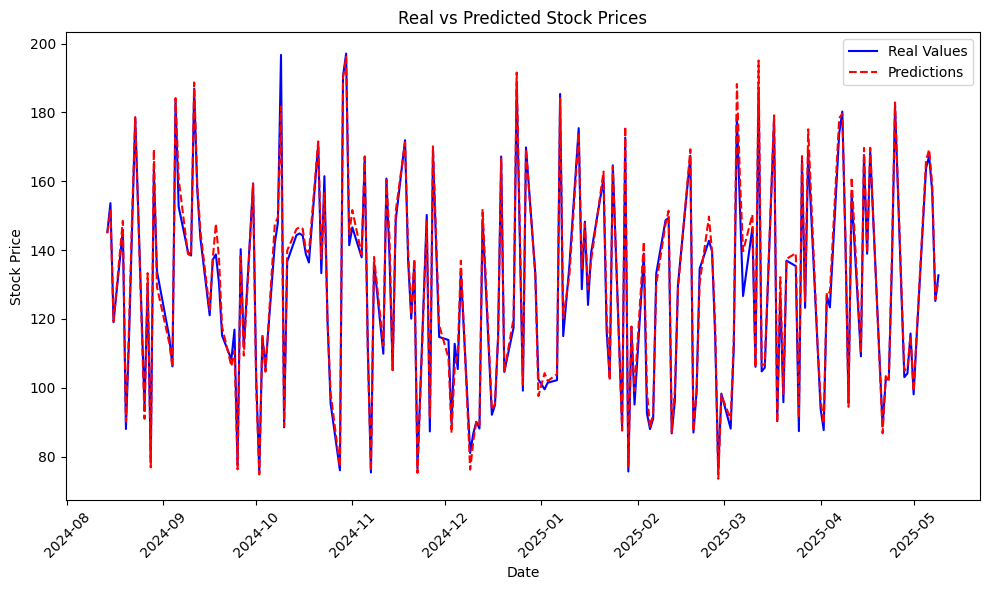

In [61]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='RNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity,
    google=True
)

FGSM – Epsilon 0.01 – MAE: 5.6246 | SIM: 0.9991 | RSME: 6.0695
BIM – Epsilon 0.01 – MAE: 5.6246 | SIM: 0.9991 | RSME: 6.0685
TCA – Epsilon 0.01 – MAE: 3.3440 | SIM: 0.9997 | RSME: 4.1719


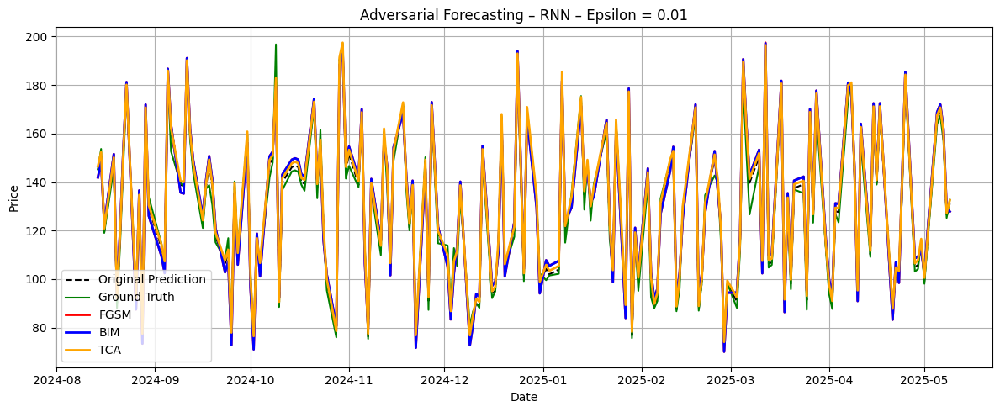

FGSM – Epsilon 0.10 – MAE: 32.4551 | SIM: 0.9774 | RSME: 32.7213
BIM – Epsilon 0.10 – MAE: 33.4062 | SIM: 0.9764 | RSME: 33.7121
TCA – Epsilon 0.10 – MAE: 16.1201 | SIM: 0.9993 | RSME: 16.4179


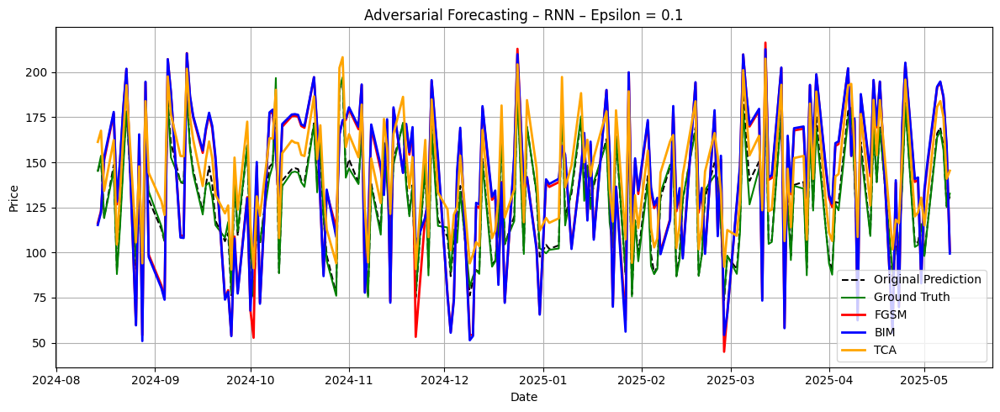

FGSM – Epsilon 0.20 – MAE: 56.3674 | SIM: 0.9394 | RSME: 57.3497
BIM – Epsilon 0.20 – MAE: 60.3919 | SIM: 0.9339 | RSME: 61.3393
TCA – Epsilon 0.20 – MAE: 30.5763 | SIM: 0.9984 | RSME: 30.8318


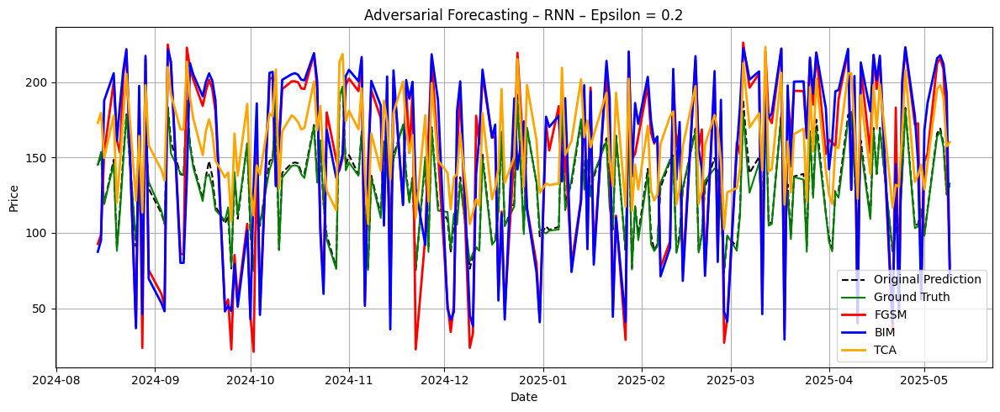

In [62]:
run_and_log_attack_google(
    model=model_google_RNN,
    model_name='RNN',
    loss_fn=loss_fn,
    test_loader=test_loader,
    test_dates=test_dates,
    predictions_denorm=predictions_denorm,
    true_values_denorm=true_values_denorm,
    price_min=price_min,
    price_max=price_max,
    res_tab=res_tab
)


## CNN PART

In [63]:
model_google_CNN = SimpleCNN(input_channels=5, output_size=1)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google_CNN.parameters(), lr=0.01)
num_epochs = 10
train_model_with_validation(model_google_CNN, loss_fn, optimizer, num_epochs, train_loader, val_loader, sequence_length)

Epoch [1/10], Train Loss: 0.0408, Validation Loss: 0.0059
Epoch [2/10], Train Loss: 0.0034, Validation Loss: 0.0028
Epoch [3/10], Train Loss: 0.0027, Validation Loss: 0.0028
Epoch [4/10], Train Loss: 0.0029, Validation Loss: 0.0028
Epoch [5/10], Train Loss: 0.0027, Validation Loss: 0.0027
Epoch [6/10], Train Loss: 0.0034, Validation Loss: 0.0059
Epoch [7/10], Train Loss: 0.0033, Validation Loss: 0.0032
Epoch [8/10], Train Loss: 0.0027, Validation Loss: 0.0029
Epoch [9/10], Train Loss: 0.0031, Validation Loss: 0.0027
Epoch [10/10], Train Loss: 0.0030, Validation Loss: 0.0032


In [64]:
from utils.google_stock.google_eval import evaluate_model_google
results = evaluate_model_google(model_google_CNN, test_loader, dates, train_size, val_size)

real_values = results['real_values']
predicted_values = results['predicted_values']
test_dates = results['test_dates']

CNN | NA – Epsilon 0.00 – MAE: 6.5222 | SIM: 0.9985


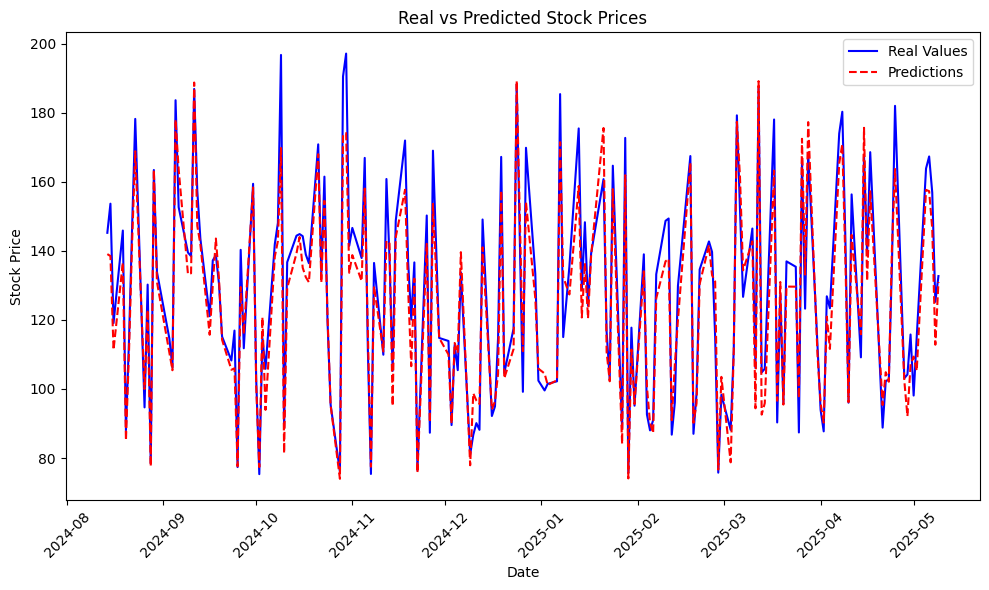

In [65]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

log_and_plot_predictions(
    true_values=true_values_denorm,
    predictions=predictions_denorm,
    test_dates=test_dates,
    true_values_rolling=true_values_denorm_month,
    predictions_rolling=predictions_denorm_month,
    model_name='CNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab_temp,
    similarity_fn=scalar_similarity,
    google=True
)

FGSM – Epsilon 0.01 – MAE: 7.9253 | SIM: 0.9980 | RSME: 9.2631
BIM – Epsilon 0.01 – MAE: 7.9238 | SIM: 0.9980 | RSME: 9.2624
TCA – Epsilon 0.01 – MAE: 6.2353 | SIM: 0.9984 | RSME: 7.7660


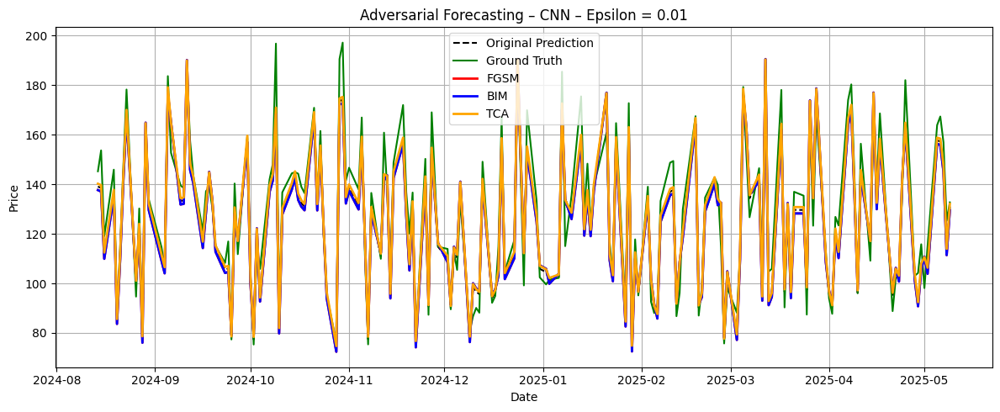

FGSM – Epsilon 0.10 – MAE: 20.5149 | SIM: 0.9884 | RSME: 21.1098
BIM – Epsilon 0.10 – MAE: 20.3303 | SIM: 0.9886 | RSME: 20.9884
TCA – Epsilon 0.10 – MAE: 9.4462 | SIM: 0.9981 | RSME: 11.2463


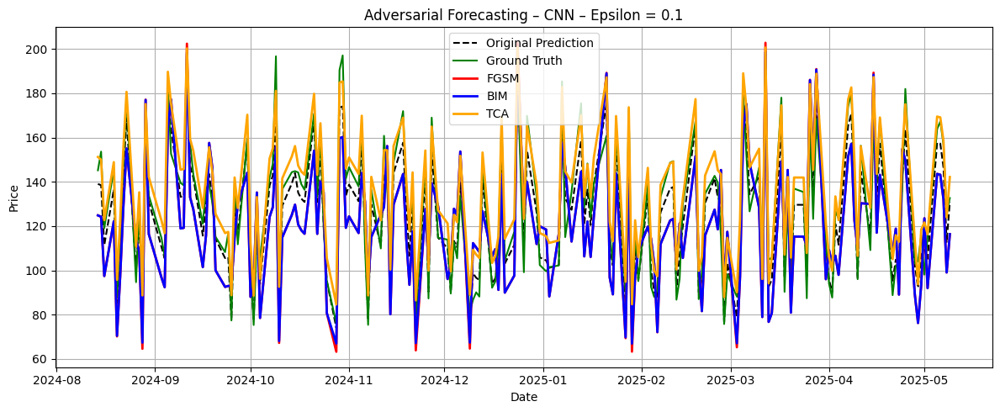

FGSM – Epsilon 0.20 – MAE: 34.2878 | SIM: 0.9659 | RSME: 34.7674
BIM – Epsilon 0.20 – MAE: 33.5134 | SIM: 0.9674 | RSME: 34.2214
TCA – Epsilon 0.20 – MAE: 20.1332 | SIM: 0.9978 | RSME: 21.3810


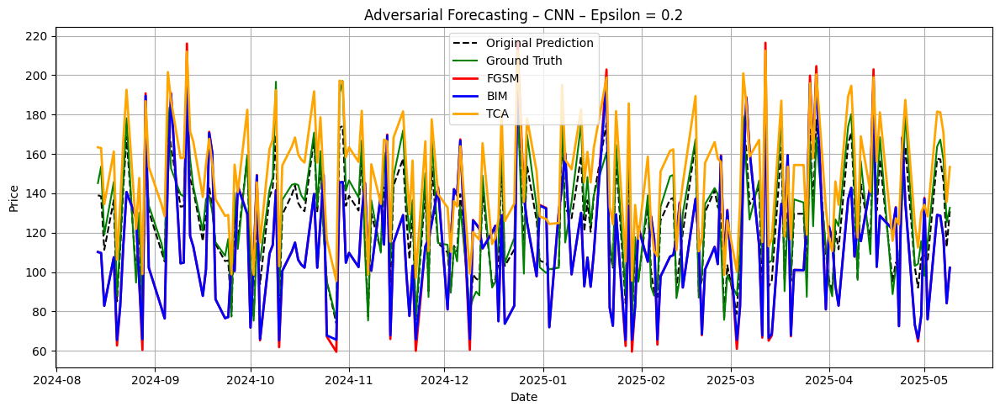

In [66]:
run_and_log_attack_google(
    model=model_google_CNN,
    model_name='CNN',
    loss_fn=loss_fn,
    test_loader=test_loader,
    test_dates=test_dates,
    predictions_denorm=predictions_denorm,
    true_values_denorm=true_values_denorm,
    price_min=price_min,
    price_max=price_max,
    res_tab=res_tab
)


## PLOT RESULT TAB

In [67]:
display(res_tab)

Attack         NA      FGSM                             BIM             \
ε            0.00      0.01       0.10       0.20      0.01       0.10   
Model Metric                                                             
LSTM  MAE     NaN  5.288747  18.108101  32.206642  5.287304  18.059940   
      RSME    NaN  6.023798  18.342467  32.364428  6.021909  18.298936   
      SIM     NaN  0.999418   0.995469   0.987468  0.999418   0.995464   
RNN   MAE     NaN  5.624623  32.455051  56.367390  5.624609  33.406246   
      RSME    NaN  6.069468  32.721294  57.349691  6.068485  33.712055   
      SIM     NaN  0.999101   0.977364   0.939445  0.999101   0.976421   
CNN   MAE     NaN  7.925319  20.514864  34.287819  7.923754  20.330284   
      SIM     NaN  0.997968   0.988394   0.965906  0.997969   0.988582   
      RSME    NaN  9.263143  21.109764  34.767381  9.262437  20.988404   

Attack                        TCA                        
ε                  0.20      0.01       0.10       0.20  
Model Metric                                             
LSTM  MAE     31.663628  4.879818  16.424410  29.676704  
      RSME    31.915612  5.771256  16.806097  29.923711  
      SIM      0.987414  0.999581   0.999315   0.998654  
RNN   MAE     60.391907  3.344030  16.120077  30.576345  
      RSME    61.339272  4.171870  16.417889  30.831783  
      SIM      0.933907  0.999704   0.999336   0.998441  
CNN   MAE     33.513397  6.235304   9.446237  20.133205  
      SIM      0.967413  0.998424   0.998075   0.997836  
      RSME    34.221393  7.766008  11.246295  21.381007

## Analysis and Question

* As observed in the temperature prediction dataset, the results for FGSM and BIM attacks are surprisingly similar across all models (LSTM, RNN, CNN), particularly in terms of MAE and RMSE. This is counter-intuitive, as BIM is designed to be a stronger iterative version of FGSM. In most literature, BIM tends to lead to larger perturbations and more severe degradation in performance.

* Moreover, across all models, TCA tends to produce the highest SIM values among all attacks, which aligns with its design principle: maintaining structural similarity while degrading predictive accuracy.
However, TCA often results in lower MAE and RMSE compared to FGSM/BIM, especially at higher perturbation levels(ε). This suggests that while TCA is more stealthy, its impact on prediction accuracy is generally less severe than FGSM or BIM. This behavior is consistent with the trade-off TCA is designed for: preserving the temporal structure of the original signal (hence high SIM) at the cost of achieving less drastic prediction errors. This makes TCA potentially more dangerous in practice, as its higher stealthiness can evade detection despite causing smaller but consistent degradations in performance.